In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import pandas_profiling as pp

In [365]:
assessments=pd.read_csv('assessments.csv')
assessments.head(5)

,code_module,code_presentation,id_assessment,assessment_type,date,weight
0,AAA,2013J,1752,TMA,19,10.0
1,AAA,2013J,1753,TMA,54,20.0
2,AAA,2013J,1754,TMA,117,20.0
3,AAA,2013J,1755,TMA,166,20.0
4,AAA,2013J,1756,TMA,215,30.0


In [3]:
assessments[['code_module','code_presentation']].duplicated().sum()

184

In [4]:
pp.ProfileReport(assessments)

Number of variables,6
Number of observations,206
Total Missing (%),0.0%
Total size in memory,9.7 KiB
Average record size in memory,48.4 B
Numeric,2
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [404]:
courses=pd.read_csv('courses.csv')
courses.head()

,code_module,code_presentation,module_presentation_length
0,AAA,2013J,268
1,AAA,2014J,269
2,BBB,2013J,268
3,BBB,2014J,262
4,BBB,2013B,240


In [6]:
pp.ProfileReport(courses)

Number of variables,3
Number of observations,22
Total Missing (%),0.0%
Total size in memory,608.0 B
Average record size in memory,27.6 B
Numeric,1
Categorical,2
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [5]:
studentAssessment=pd.read_csv('studentAssessment.csv')
studentAssessment.head()

,id_assessment,id_student,date_submitted,is_banked,score
0,1752,11391,18,0,78
1,1752,28400,22,0,70
2,1752,31604,17,0,72
3,1752,32885,26,0,69
4,1752,38053,19,0,79


In [6]:
studentAssessment[['id_assessment']].duplicated().sum()

173724

In [7]:
# np.array(studentAssessment['score']).astype(str).astype(int)

missingvallist=np.where(pd.to_numeric(studentAssessment['score'].astype(str).str.replace(',',''), errors='coerce').fillna(-999).astype(int)==-999)

In [8]:
missingstudentscorelistofid=list(studentAssessment.iloc[missingvallist]['id_student'])
# missingstudentscorelistofid

In [11]:
pp.ProfileReport(studentAssessment)

Number of variables,5
Number of observations,173912
Total Missing (%),0.0%
Total size in memory,6.6 MiB
Average record size in memory,40.0 B
Numeric,3
Categorical,1
Boolean,1
Date,0
Text (Unique),0
Rejected,0


In [9]:
studentInfo=pd.read_csv('studentInfo.csv')
studentInfo.head()

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,Pass
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,Pass
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,Withdrawn
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,Pass
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,Pass


In [10]:
studentInfo['final_result'].value_counts()

Pass           12361
Withdrawn      10156
Fail            7052
Distinction     3024
Name: final_result, dtype: int64

In [11]:
studentInfo.iloc[list((studentInfo[studentInfo['id_student'].isin(missingstudentscorelistofid)]['final_result']=='Pass').index)]

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result
108,AAA,2013J,260355,F,London Region,A Level or Equivalent,80-90%,35-55,0,60,N,Withdrawn
227,AAA,2013J,721259,F,South Region,Lower Than A Level,50-60%,55<=,0,120,N,Withdrawn
466,AAA,2014J,260355,F,London Region,A Level or Equivalent,80-90%,35-55,1,120,N,Withdrawn
638,AAA,2014J,721259,F,South Region,Lower Than A Level,50-60%,55<=,1,60,N,Withdrawn
733,AAA,2014J,2606802,M,North Region,A Level or Equivalent,60-70%,0-35,0,60,N,Fail
753,BBB,2013B,33666,F,London Region,A Level or Equivalent,10-20,0-35,1,60,N,Withdrawn
843,BBB,2013B,186780,F,North Western Region,A Level or Equivalent,10-20,35-55,2,120,Y,Withdrawn
886,BBB,2013B,262294,F,North Western Region,Lower Than A Level,0-10%,0-35,2,60,Y,Withdrawn
1221,BBB,2013B,478317,F,Scotland,Lower Than A Level,0-10%,0-35,1,120,N,Withdrawn
1256,BBB,2013B,484039,F,Yorkshire Region,A Level or Equivalent,30-40%,0-35,0,180,N,Fail


In [15]:
pp.ProfileReport(studentInfo)

Number of variables,12
Number of observations,32593
Total Missing (%),0.0%
Total size in memory,3.0 MiB
Average record size in memory,96.0 B
Numeric,3
Categorical,9
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [13]:
studentRegistration=pd.read_csv('studentRegistration.csv')
studentRegistration.head()

,code_module,code_presentation,id_student,date_registration,date_unregistration
0,AAA,2013J,11391,-159,?
1,AAA,2013J,28400,-53,?
2,AAA,2013J,30268,-92,12
3,AAA,2013J,31604,-52,?
4,AAA,2013J,32885,-176,?


In [17]:
pp.ProfileReport(studentRegistration)

Number of variables,5
Number of observations,32593
Total Missing (%),0.0%
Total size in memory,1.2 MiB
Average record size in memory,40.0 B
Numeric,1
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [14]:
studentVle=pd.read_csv('studentVle.csv')
studentVle.head()

,code_module,code_presentation,id_student,id_site,date,sum_click
0,AAA,2013J,28400,546652,-10,4
1,AAA,2013J,28400,546652,-10,1
2,AAA,2013J,28400,546652,-10,1
3,AAA,2013J,28400,546614,-10,11
4,AAA,2013J,28400,546714,-10,1


In [19]:
pp.ProfileReport(studentVle)

Number of variables,6
Number of observations,10655280
Total Missing (%),0.0%
Total size in memory,487.8 MiB
Average record size in memory,48.0 B
Numeric,4
Categorical,2
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [15]:
vle=pd.read_csv('vle.csv')
vle.head()

,id_site,code_module,code_presentation,activity_type,week_from,week_to
0,546943,AAA,2013J,resource,?,?
1,546712,AAA,2013J,oucontent,?,?
2,546998,AAA,2013J,resource,?,?
3,546888,AAA,2013J,url,?,?
4,547035,AAA,2013J,resource,?,?


In [16]:
vle.activity_type.value_counts()

resource          2660
subpage           1055
oucontent          996
url                886
forumng            194
quiz               127
page               102
oucollaborate       82
questionnaire       61
ouwiki              49
dataplus            28
externalquiz        26
homepage            22
glossary            21
ouelluminate        21
dualpane            20
repeatactivity       5
htmlactivity         4
sharedsubpage        3
folder               2
Name: activity_type, dtype: int64

In [22]:
pp.ProfileReport(vle)

Number of variables,6
Number of observations,6364
Total Missing (%),0.0%
Total size in memory,298.4 KiB
Average record size in memory,48.0 B
Numeric,1
Categorical,5
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [17]:
vle.head(14)

,id_site,code_module,code_presentation,activity_type,week_from,week_to
0,546943,AAA,2013J,resource,?,?
1,546712,AAA,2013J,oucontent,?,?
2,546998,AAA,2013J,resource,?,?
3,546888,AAA,2013J,url,?,?
4,547035,AAA,2013J,resource,?,?
5,546614,AAA,2013J,homepage,?,?
6,546897,AAA,2013J,url,?,?
7,546678,AAA,2013J,oucontent,?,?
8,546933,AAA,2013J,resource,?,?
9,546708,AAA,2013J,oucontent,?,?


In [368]:
vle.activity_type.value_counts()

resource          2660
subpage           1055
oucontent          996
url                886
forumng            194
quiz               127
page               102
oucollaborate       82
questionnaire       61
ouwiki              49
dataplus            28
externalquiz        26
homepage            22
glossary            21
ouelluminate        21
dualpane            20
repeatactivity       5
htmlactivity         4
sharedsubpage        3
folder               2
Name: activity_type, dtype: int64

In [18]:
studentInfo[(studentInfo['code_module']=='BBB') & (studentInfo['code_presentation']=='2013J')]

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result
2515,BBB,2013J,23632,F,East Anglian Region,A Level or Equivalent,40-50%,0-35,0,60,N,Withdrawn
2516,BBB,2013J,23798,M,Wales,A Level or Equivalent,50-60%,0-35,0,60,N,Distinction
2517,BBB,2013J,25629,F,Scotland,Lower Than A Level,20-30%,0-35,0,120,N,Withdrawn
2518,BBB,2013J,26677,M,West Midlands Region,A Level or Equivalent,0-10%,0-35,4,60,N,Withdrawn
2519,BBB,2013J,27457,F,South East Region,Lower Than A Level,40-50%,35-55,0,60,N,Withdrawn
2520,BBB,2013J,27759,M,North Western Region,Lower Than A Level,40-50%,35-55,0,120,Y,Fail
2521,BBB,2013J,30091,F,South West Region,A Level or Equivalent,10-20,0-35,0,60,Y,Pass
2522,BBB,2013J,31014,F,West Midlands Region,Lower Than A Level,80-90%,35-55,0,120,N,Withdrawn
2523,BBB,2013J,31849,F,South West Region,Lower Than A Level,60-70%,35-55,0,120,N,Pass
2524,BBB,2013J,37622,F,Scotland,HE Qualification,80-90%,0-35,1,120,N,Pass


In [19]:
student = pd.merge(studentInfo, courses,  how='left', on=['code_module','code_presentation'])

In [20]:
student = pd.merge(student, studentRegistration,  how='left', on=['code_module','code_presentation','id_student'])
student.head()

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,module_presentation_length,date_registration,date_unregistration
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,Pass,268,-159,?
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,Pass,268,-53,?
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,Withdrawn,268,-92,12
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,Pass,268,-52,?
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,Pass,268,-176,?


In [21]:
vle["week_from"]= vle["week_from"].str.replace("?",'-999')
vle["week_to"]= vle["week_to"].str.replace("?",'-999')
vle.head()



,id_site,code_module,code_presentation,activity_type,week_from,week_to
0,546943,AAA,2013J,resource,-999,-999
1,546712,AAA,2013J,oucontent,-999,-999
2,546998,AAA,2013J,resource,-999,-999
3,546888,AAA,2013J,url,-999,-999
4,547035,AAA,2013J,resource,-999,-999


In [22]:
temp1=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).sum()[['id_site','date','sum_click']]
temp1.columns=['Sum_id_site','Sum_date','Sum_sum_click']
temp1.drop('Sum_id_site',1,inplace=True)

temp2=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).mean()[['id_site','date','sum_click']]
temp2.columns=['Mean_id_site','Mean_date','Mean_sum_click']
temp2.drop('Mean_id_site',1,inplace=True)

temp3=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).count()[['id_site','date','sum_click']]
temp3.columns=['Count_id_site','Count_date','Count_sum_click']
temp3.drop(['Count_id_site','Count_date'],1,inplace=True)

temp3.columns=['Count_ALL_Click']
temp4 = studentVle.groupby(['id_student', 'code_module', 'code_presentation']).agg(lambda x:x.value_counts().index[0])
temp4.columns=['Mode_id_site','Mode_date','Mode_sum_click']
temp4.head()

temp5=pd.concat([temp1,temp2,temp3,temp4], axis=1)

In [23]:
temp5.reset_index(level=['id_student','code_module','code_presentation'],inplace=True)
print("temp5 shape is :",temp5.shape)
temp5.head()

temp5 shape is : (29228, 11)


,id_student,code_module,code_presentation,Sum_date,Sum_sum_click,Mean_date,Mean_sum_click,Count_ALL_Click,Mode_id_site,Mode_date,Mode_sum_click
0,6516,AAA,2014J,73140,2791,110.483384,4.216012,662,877030,0,1
1,8462,DDD,2013J,11247,646,37.490000,2.153333,300,673519,8,1
2,8462,DDD,2014J,40,10,10.000000,2.500000,4,813710,10,1
3,11391,AAA,2013J,20018,934,102.132653,4.765306,196,546614,242,1
4,23629,BBB,2013B,2539,161,43.033898,2.728814,59,542864,50,1


In [24]:
studentVle.shape

(10655280, 6)

In [25]:
student2 = pd.merge(studentVle, vle,  how='left',on=['id_site','code_module','code_presentation'])
student2.head()

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type,week_from,week_to
0,AAA,2013J,28400,546652,-10,4,forumng,-999,-999
1,AAA,2013J,28400,546652,-10,1,forumng,-999,-999
2,AAA,2013J,28400,546652,-10,1,forumng,-999,-999
3,AAA,2013J,28400,546614,-10,11,homepage,-999,-999
4,AAA,2013J,28400,546714,-10,1,oucontent,-999,-999


In [26]:
one_hot = pd.get_dummies(student2['activity_type'],prefix='ActivityType')
student2 = student2.drop('activity_type',axis = 1)
student2 = student2.join(one_hot)
student2.head()
student2.drop(['ActivityType_sharedsubpage','ActivityType_repeatactivity'],1,inplace=True)
student2.head()

,code_module,code_presentation,id_student,id_site,date,sum_click,week_from,week_to,ActivityType_dataplus,ActivityType_dualpane,...,ActivityType_oucollaborate,ActivityType_oucontent,ActivityType_ouelluminate,ActivityType_ouwiki,ActivityType_page,ActivityType_questionnaire,ActivityType_quiz,ActivityType_resource,ActivityType_subpage,ActivityType_url
0,AAA,2013J,28400,546652,-10,4,-999,-999,0,0,...,0,0,0,0,0,0,0,0,0,0
1,AAA,2013J,28400,546652,-10,1,-999,-999,0,0,...,0,0,0,0,0,0,0,0,0,0
2,AAA,2013J,28400,546652,-10,1,-999,-999,0,0,...,0,0,0,0,0,0,0,0,0,0
3,AAA,2013J,28400,546614,-10,11,-999,-999,0,0,...,0,0,0,0,0,0,0,0,0,0
4,AAA,2013J,28400,546714,-10,1,-999,-999,0,0,...,0,1,0,0,0,0,0,0,0,0


In [27]:
listofactivity=['ActivityType_dataplus','ActivityType_dualpane','ActivityType_externalquiz','ActivityType_folder','ActivityType_forumng','ActivityType_glossary','ActivityType_homepage','ActivityType_htmlactivity','ActivityType_oucollaborate','ActivityType_oucontent','ActivityType_ouelluminate','ActivityType_ouwiki','ActivityType_page','ActivityType_questionnaire','ActivityType_quiz','ActivityType_resource','ActivityType_subpage','ActivityType_url']
temp1=student2.groupby(['id_student', 'code_module', 'code_presentation']).sum()[listofactivity]
listofactivity2=[x+'_Sum' for x in listofactivity]
temp1.columns=listofactivity2

temp2=student2.groupby(['id_student', 'code_module', 'code_presentation']).mean()[listofactivity]
listofactivity2=[x+'_Mean' for x in listofactivity]
temp2.columns=listofactivity2

temp3=student2.groupby(['id_student', 'code_module', 'code_presentation']).count()[listofactivity]
listofactivity2=[x+'_Count' for x in listofactivity]
temp3.columns=listofactivity2

dummystudent2=student2.copy()
dummystudent2.drop(['id_site','date','sum_click','week_from','week_to'],axis=1,inplace=True)
temp4=dummystudent2.groupby(['id_student', 'code_module', 'code_presentation']).agg(lambda x:x.value_counts().index[0])
listofactivity2=[x+'_Mode' for x in listofactivity]
temp4.columns=listofactivity2
temp4.ix[:,'ActivityType_dataplus':].sum()
temp5=pd.concat([temp1,temp2,temp3,temp4], axis=1)
temp5.head()

temp1=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).sum()[['id_site','date','sum_click']]
temp1.columns=['Sum_id_site','Sum_date','Sum_sum_click']
temp1.drop('Sum_id_site',1,inplace=True)

temp2=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).mean()[['id_site','date','sum_click']]
temp2.columns=['Mean_id_site','Mean_date','Mean_sum_click']
temp2.drop('Mean_id_site',1,inplace=True)

temp3=studentVle.groupby(['id_student', 'code_module', 'code_presentation']).count()[['id_site','date','sum_click']]
temp3.columns=['Count_id_site','Count_date','Count_sum_click']
temp3.drop(['Count_id_site','Count_date'],1,inplace=True)

temp3.columns=['Count_ALL_Click']
temp4 = studentVle.groupby(['id_student', 'code_module', 'code_presentation']).agg(lambda x:x.value_counts().index[0])
temp4.columns=['Mode_id_site','Mode_date','Mode_sum_click']
temp4.head()

listofweek=['week_from','week_to']
temp7=student2.groupby(['id_student', 'code_module', 'code_presentation']).max()[listofweek]
listofweek=[x+'_Max' for x in listofweek]
temp7.columns=listofweek


temp6=pd.concat([temp5,temp1,temp2,temp3,temp4,temp7], axis=1)

temp6.reset_index(level=['id_student','code_module','code_presentation'],inplace=True)
print("temp6 shape is :",temp6.shape)
studentVle_vle=temp6.copy()
studentVle_vle.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


temp6 shape is : (29228, 85)


,id_student,code_module,code_presentation,ActivityType_dataplus_Sum,ActivityType_dualpane_Sum,ActivityType_externalquiz_Sum,ActivityType_folder_Sum,ActivityType_forumng_Sum,ActivityType_glossary_Sum,ActivityType_homepage_Sum,...,Sum_date,Sum_sum_click,Mean_date,Mean_sum_click,Count_ALL_Click,Mode_id_site,Mode_date,Mode_sum_click,week_from_Max,week_to_Max
0,6516,AAA,2014J,4.0,0.0,0.0,0.0,175.0,0.0,158.0,...,73140,2791,110.483384,4.216012,662,877030,0,1,2,2
1,8462,DDD,2013J,0.0,0.0,9.0,0.0,19.0,0.0,52.0,...,11247,646,37.490000,2.153333,300,673519,8,1,-999,-999
2,8462,DDD,2014J,0.0,0.0,0.0,0.0,2.0,0.0,1.0,...,40,10,10.000000,2.500000,4,813710,10,1,-999,-999
3,11391,AAA,2013J,0.0,0.0,0.0,0.0,52.0,0.0,40.0,...,20018,934,102.132653,4.765306,196,546614,242,1,2,2
4,23629,BBB,2013B,0.0,0.0,0.0,0.0,24.0,0.0,16.0,...,2539,161,43.033898,2.728814,59,542864,50,1,-999,-999


In [28]:
studentAssessment_assesment = pd.merge(studentAssessment, assessments,  how='left', on=['id_assessment'])

In [29]:
studentAssessment_assesment['date'].astype(str).str.replace('?','-99').astype(int).mean() 
126.82313468880814 +(2865*99)/(173912-2865)
# 2865 are ? and we are replacing them by -99 which leads to actual mean of 128
studentAssessment_assesment['date'].astype(str).str.replace('?','128').astype(int).mean() 
studentAssessment_assesment['date']=studentAssessment_assesment['date'].astype(str).str.replace('?','128').astype(int)


In [30]:
studentAssessment_assesment['score'].astype(str).str.replace('?','-99').astype(int).mean() 
75.62569000414003 +(173*99)/(173912-173)
# studentAssessment_assesment['score'].astype(str).str.replace('?','75').astype(int).mean() 
studentAssessment_assesment['score']=studentAssessment_assesment['score'].astype(str).str.replace('?','75').astype(int)
studentAssessment_assesment['score'].mean()

75.79877754266525

In [31]:
one_hot = pd.get_dummies(studentAssessment_assesment['assessment_type'],prefix='assessment_type')
studentAssessment_assesment = studentAssessment_assesment.drop('assessment_type',axis = 1)
studentAssessment_assesment = studentAssessment_assesment.join(one_hot)
studentAssessment_assesment.head()

,id_assessment,id_student,date_submitted,is_banked,score,code_module,code_presentation,date,weight,assessment_type_CMA,assessment_type_Exam,assessment_type_TMA
0,1752,11391,18,0,78,AAA,2013J,19,10.0,0,0,1
1,1752,28400,22,0,70,AAA,2013J,19,10.0,0,0,1
2,1752,31604,17,0,72,AAA,2013J,19,10.0,0,0,1
3,1752,32885,26,0,69,AAA,2013J,19,10.0,0,0,1
4,1752,38053,19,0,79,AAA,2013J,19,10.0,0,0,1


In [32]:
cols=['id_assessment','date_submitted','is_banked','score','date','weight','assessment_type_CMA','assessment_type_Exam','assessment_type_TMA']
temp1=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).sum()[cols]
cols2=[x+'_Sum' for x in cols]
temp1.columns=cols2

temp2=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).mean()[cols]
cols2=[x+'_Mean' for x in cols]
temp2.columns=cols2

temp3=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).max()[cols]
cols2=[x+'_Max' for x in cols]
temp3.columns=cols2

temp4=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).min()[cols]
cols2=[x+'_Min' for x in cols]
temp4.columns=cols2

temp5=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).count()[cols]
cols2=[x+'_Count' for x in cols]
temp5.columns=cols2

temp6=studentAssessment_assesment.groupby(['id_student','code_module','code_presentation']).agg(lambda x:x.value_counts().index[0])
cols2=[x+'_Mode' for x in cols]
temp6.columns=cols2


In [33]:
temp7=pd.concat([temp1,temp2,temp3,temp4,temp5,temp6], axis=1)
temp7.head()

id_assessment_Sum  \
id_student code_module code_presentation                      
6516       AAA         2014J                           8800   
8462       DDD         2013J                          76047   
                       2014J                         101454   
11391      AAA         2013J                           8770   
23629      BBB         2013B                          59952   

                                          date_submitted_Sum  is_banked_Sum  \
id_student code_module code_presentation                                      
6516       AAA         2014J                             558              0   
8462       DDD         2013J                             165              0   
                       2014J                              -4              4   
11391      AAA         2013J                             562              0   
23629      BBB         2013B                             223              0   

                                          score_Sum  date_Sum  weight_Sum  \
id_student code_module code_presentation                                    
6516       AAA         2014J                    309       571       100.0   
8462       DDD         2013J                    263       166        40.0   
                       2014J                    346       234        50.0   
11391      AAA         2013J                    410       571       100.0   
23629      BBB         2013B                    330       209        25.0   

                                          assessment_type_CMA_Sum  \
id_student code_module code_presentation                            
6516       AAA         2014J                                    0   
8462       DDD         2013J                                    0   
                       2014J                                    0   
11391      AAA         2013J                                    0   
23629      BBB         2013B                                    2   

                                          assessment_type_Exam_Sum  \
id_student code_module code_presentation                             
6516       AAA         2014J                                     0   
8462       DDD         2013J                                     0   
                       2014J                                     0   
11391      AAA         2013J                                     0   
23629      BBB         2013B                                     0   

                                          assessment_type_TMA_Sum  \
id_student code_module code_presentation                            
6516       AAA         2014J                                    5   
8462       DDD         2013J                                    3   
                       2014J                                    4   
11391      AAA         2013J                                    5   
23629      BBB         2013B                                    2   

                                          id_assessment_Mean  \
id_student code_module code_presentation                       
6516       AAA         2014J                          1760.0   
8462       DDD         2013J                         25349.0   
                       2014J                         25363.5   
11391      AAA         2013J                          1754.0   
23629      BBB         2013B                         14988.0   

                                                    ...             \
id_student code_module code_presentation            ...              
6516       AAA         2014J                        ...              
8462       DDD         2013J                        ...              
                       2014J                        ...              
11391      AAA         2013J                        ...              
23629      BBB         2013B                        ...              

                                          assessment_type_TMA_Count  \
id_student code_module code_presenta

In [34]:
temp7.reset_index(level=['id_student','code_module','code_presentation'],inplace=True)
temp7.shape

(25843, 57)

In [35]:
studentAssessment_assesment_new=temp7.copy()
studentAssessment_assesment_new[['id_student','code_module','code_presentation']].duplicated().sum()

0

In [370]:
studentAssessment_assesment_new.head()

,id_student,code_module,code_presentation,id_assessment_Sum,date_submitted_Sum,is_banked_Sum,score_Sum,date_Sum,weight_Sum,assessment_type_CMA_Sum,...,assessment_type_TMA_Count,id_assessment_Mode,date_submitted_Mode,is_banked_Mode,score_Mode,date_Mode,weight_Mode,assessment_type_CMA_Mode,assessment_type_Exam_Mode,assessment_type_TMA_Mode
0,6516,AAA,2014J,8800,558,0,309,571,100.0,0,...,5,1759,164,0,63,215,20.0,0,0,1
1,8462,DDD,2013J,76047,165,0,263,166,40.0,0,...,3,25350,51,0,83,88,17.5,0,0,1
2,8462,DDD,2014J,101454,-4,4,346,234,50.0,0,...,4,25365,-1,1,83,111,10.0,0,0,1
3,11391,AAA,2013J,8770,562,0,410,571,100.0,0,...,5,1756,212,0,85,215,20.0,0,0,1
4,23629,BBB,2013B,59952,223,0,330,209,25.0,2,...,4,14991,95,0,100,47,1.0,1,0,1


In [369]:
pp.ProfileReport(studentAssessment_assesment_new)

Number of variables,57
Number of observations,25843
Total Missing (%),0.0%
Total size in memory,8.4 MiB
Average record size in memory,340.0 B
Numeric,25
Categorical,2
Boolean,9
Date,0
Text (Unique),0
Rejected,21


In [36]:
student.shape

(32593, 15)

In [37]:
studentVle_vle.head()

,id_student,code_module,code_presentation,ActivityType_dataplus_Sum,ActivityType_dualpane_Sum,ActivityType_externalquiz_Sum,ActivityType_folder_Sum,ActivityType_forumng_Sum,ActivityType_glossary_Sum,ActivityType_homepage_Sum,...,Sum_date,Sum_sum_click,Mean_date,Mean_sum_click,Count_ALL_Click,Mode_id_site,Mode_date,Mode_sum_click,week_from_Max,week_to_Max
0,6516,AAA,2014J,4.0,0.0,0.0,0.0,175.0,0.0,158.0,...,73140,2791,110.483384,4.216012,662,877030,0,1,2,2
1,8462,DDD,2013J,0.0,0.0,9.0,0.0,19.0,0.0,52.0,...,11247,646,37.490000,2.153333,300,673519,8,1,-999,-999
2,8462,DDD,2014J,0.0,0.0,0.0,0.0,2.0,0.0,1.0,...,40,10,10.000000,2.500000,4,813710,10,1,-999,-999
3,11391,AAA,2013J,0.0,0.0,0.0,0.0,52.0,0.0,40.0,...,20018,934,102.132653,4.765306,196,546614,242,1,2,2
4,23629,BBB,2013B,0.0,0.0,0.0,0.0,24.0,0.0,16.0,...,2539,161,43.033898,2.728814,59,542864,50,1,-999,-999


In [38]:
studentVle_vle.shape

(29228, 85)

In [39]:
studentVle_vle[['id_student','code_module','code_presentation']].duplicated().sum()


0

In [40]:
student[['id_student','code_module','code_presentation']].duplicated().sum()


0

In [41]:
print(student.isna().sum().sum())
print(studentAssessment_assesment_new.isna().sum().sum())
print(studentVle_vle.isna().sum().sum())

0
0
0


In [42]:
studentAssessment_assesment[['id_student','code_module','code_presentation']].duplicated().sum()

148069

In [43]:
maindf= pd.merge(student, studentVle_vle,  how='left', on=['id_student','code_module','code_presentation'])
print("shape of maindf is now: ",maindf.shape)
maindf.head(2)

shape of maindf is now:  (32593, 97)


,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,...,Sum_date,Sum_sum_click,Mean_date,Mean_sum_click,Count_ALL_Click,Mode_id_site,Mode_date,Mode_sum_click,week_from_Max,week_to_Max
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,...,20018.0,934.0,102.132653,4.765306,196.0,546614.0,242.0,1.0,2,2
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,...,37407.0,1435.0,86.993023,3.337209,430.0,546614.0,-7.0,1.0,2,2


In [44]:
# print("Previous shape of maindf is now: ",maindf.shape)
# maindf= pd.merge(maindf, studentAssessment_assesment_new,  how='left', on=['id_student','code_module','code_presentation'])
# print("shape of maindf is now: ",maindf.shape)
# maindf.head(2)

print("Previous shape of maindf is now: ",maindf.shape)
maindf= pd.merge(maindf, studentAssessment_assesment_new,  how='inner', on=['id_student','code_module','code_presentation'])
print("shape of maindf is now: ",maindf.shape)
maindf.head(2)

Previous shape of maindf is now:  (32593, 97)
shape of maindf is now:  (25843, 151)


,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,...,assessment_type_TMA_Count,id_assessment_Mode,date_submitted_Mode,is_banked_Mode,score_Mode,date_Mode,weight_Mode,assessment_type_CMA_Mode,assessment_type_Exam_Mode,assessment_type_TMA_Mode
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,...,5,1756,212,0,85,215,20.0,0,0,1
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,...,5,1756,212,0,70,215,20.0,0,0,1


In [52]:
pp.ProfileReport(maindf)

Number of variables,151
Number of observations,25843
Total Missing (%),0.1%
Total size in memory,27.1 MiB
Average record size in memory,1.1 KiB
Numeric,77
Categorical,13
Boolean,19
Date,0
Text (Unique),0
Rejected,42


In [45]:
maindf.shape

(25843, 151)

# <font color='blue'> Below Section is just for intuition to know that we have got nearly 6800 rows having Nan value containing rows when we joined two dataframes to form final one. This was when we did left join, but I have modified the code to inner join so that we do not cheat. Don't understand this ? Check in Report !! It is clearly mentioned why it happend and why I dropped those 6800 rows.

In [46]:
# list1=list(maindf.isna().sum(axis=1))
# series = pd.Series(list1) 
# result = series.nonzero() 
# print(len(result[0]))
# list(result[0]) 

In [47]:
# maindf.iloc[list(result[0]),:]['final_result'].value_counts()

In [48]:
# maindf['final_result'].value_counts()

In [49]:
# maindf.iloc[list(result[0]),:]

# <font color='blue'> Coming back to our original problem : Continuing

In [50]:
maindf.isna().sum().sum()

4100

In [51]:
maindf.isna().sum()[15:]

ActivityType_dataplus_Sum          50
ActivityType_dualpane_Sum          50
ActivityType_externalquiz_Sum      50
ActivityType_folder_Sum            50
ActivityType_forumng_Sum           50
ActivityType_glossary_Sum          50
ActivityType_homepage_Sum          50
ActivityType_htmlactivity_Sum      50
ActivityType_oucollaborate_Sum     50
ActivityType_oucontent_Sum         50
ActivityType_ouelluminate_Sum      50
ActivityType_ouwiki_Sum            50
ActivityType_page_Sum              50
ActivityType_questionnaire_Sum     50
ActivityType_quiz_Sum              50
ActivityType_resource_Sum          50
ActivityType_subpage_Sum           50
ActivityType_url_Sum               50
ActivityType_dataplus_Mean         50
ActivityType_dualpane_Mean         50
ActivityType_externalquiz_Mean     50
ActivityType_folder_Mean           50
ActivityType_forumng_Mean          50
ActivityType_glossary_Mean         50
ActivityType_homepage_Mean         50
ActivityType_htmlactivity_Mean     50
ActivityType

In [52]:
maindf.fillna(0,inplace=True)

In [53]:
maindf.isna().sum().sum()

0

In [60]:
pp.ProfileReport(maindf)

Number of variables,151
Number of observations,25843
Total Missing (%),0.0%
Total size in memory,27.1 MiB
Average record size in memory,1.1 KiB
Numeric,69
Categorical,13
Boolean,17
Date,0
Text (Unique),0
Rejected,52


In [54]:
cols=['ActivityType_dualpane_Count','Count_ALL_Click','ActivityType_ouwiki_Mode','Sum_date','date_Count','date_Sum','assessment_type_CMA_Max','assessment_type_Exam_Count','assessment_type_Exam_Max','assessment_type_Exam_Mean','assessment_type_TMA_Count','Sum_sum_click','assessment_type_CMA_Count','ActivityType_dataplus_Mode','ActivityType_dualpane_Count','ActivityType_dualpane_Mode','ActivityType_externalquiz_Count','ActivityType_externalquiz_Mode','ActivityType_folder_Count','ActivityType_folder_Mode','ActivityType_forumng_Count','ActivityType_glossary_Count','ActivityType_glossary_Mode','ActivityType_homepage_Count','ActivityType_htmlactivity_Count','ActivityType_htmlactivity_Mode','ActivityType_oucollaborate_Count','ActivityType_oucontent_Count','ActivityType_ouelluminate_Count','ActivityType_ouelluminate_Mode','ActivityType_ouwiki_Count','ActivityType_page_Count','ActivityType_page_Mode','ActivityType_questionnaire_Count','ActivityType_questionnaire_Mode','ActivityType_questionnaire_Count','ActivityType_questionnaire_Mode','ActivityType_quiz_Count','ActivityType_resource_Count','ActivityType_subpage_Count','ActivityType_url_Count','date_submitted_Count','date_submitted_Max','id_assessment_Count','id_assessment_Max','id_assessment_Min','id_assessment_Mode','is_banked_Max','score_Count','is_banked_Count','weight_Count','weight_Max','score_Sum','is_banked_Mode']
print(len(cols))
maindf.drop(cols,1,inplace=True)

54


In [55]:
maindf.shape

(25843, 100)

In [63]:
pp.ProfileReport(maindf)

Number of variables,100
Number of observations,25843
Total Missing (%),0.0%
Total size in memory,17.6 MiB
Average record size in memory,714.0 B
Numeric,69
Categorical,13
Boolean,17
Date,0
Text (Unique),0
Rejected,1


In [56]:
# ['age_band','code_module','code_presentation','disability','gender','highest_education','region']
# 3+7+4+2+2+5+13=36
# imd_band -- Integer coding by self 
#  --- withdraw distinction fail pass

In [57]:
maindf.date_registration=maindf.date_registration.astype(str).replace('?','0').astype(int)
# date_unregistration
maindf.date_unregistration=maindf.date_unregistration.astype(str).replace('?','0').astype(int)
# week_from_Max
maindf.week_from_Max=maindf.week_from_Max.astype(int)
maindf.week_to_Max=maindf.week_to_Max.astype(int)
maindf.replace({'final_result' : { 'Distinction' : 1,'Pass':1 ,'Withdrawn' : 0, 'Fail' : 0 }},inplace=True)
maindf.imd_band.value_counts()

30-40%     2780
20-30%     2749
10-20      2609
40-50%     2553
50-60%     2547
0-10%      2427
60-70%     2388
70-80%     2382
80-90%     2270
90-100%    2140
?           998
Name: imd_band, dtype: int64

In [58]:
maindf.replace({'imd_band' : { '0-10%' : 1,'10-20':2 ,'20-30%' : 3, '30-40%' : 4,'40-50%' : 5, '50-60%' : 6,'60-70%' : 7, '70-80%' : 8,'80-90%' : 9, '90-100%' : 10,'?' : 5}},inplace=True)

In [59]:
(maindf.dtypes=='object').sum()

7

In [60]:
maindf.shape

(25843, 100)

In [61]:
# maindf.get_dummies()
opendf=pd.get_dummies(data=maindf, columns=['age_band','code_module','code_presentation','disability','gender','highest_education','region'])
opendf.shape

(25843, 129)

In [62]:
opendf.drop(['id_student'],1,inplace=True)

In [63]:
opendf.corr()['final_result']

imd_band                                         0.110237
num_of_prev_attempts                            -0.121558
studied_credits                                 -0.096040
final_result                                     1.000000
module_presentation_length                       0.060302
date_registration                               -0.004412
date_unregistration                             -0.482324
ActivityType_dataplus_Sum                        0.198858
ActivityType_dualpane_Sum                        0.150078
ActivityType_externalquiz_Sum                    0.100350
ActivityType_folder_Sum                          0.160821
ActivityType_forumng_Sum                         0.300519
ActivityType_glossary_Sum                        0.091901
ActivityType_homepage_Sum                        0.504066
ActivityType_htmlactivity_Sum                    0.040204
ActivityType_oucollaborate_Sum                   0.178433
ActivityType_oucontent_Sum                       0.349870
ActivityType_o

In [64]:
opendf.to_csv("opendf.csv")

## <font color='darkred'> Also Our Accuracy Metric would be F1 Score and We can also have a look at Accuracy for corresponding model as it is not highly imbalanced  data, so for this classification model, F1 score is "good" to use and accuracy is also "fine" to use. 

## <font color='darkred'>  F1 score - F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. 

## <font color='darkred'>   Logistic Regression, KNN, Decision Trees, Random Forest on Full Dataset
## <font color='darkred'> 80% Training and 20% Testing 

# <font color='blue'>  Logistic Regression : Final Accuracy : 91.2% and F1 Score of 0.9283

In [375]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(np.array(opendf.drop(['final_result'],1)),np.array(opendf['final_result']), test_size=0.20, random_state=42)


In [376]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=500,C=0.0008)
logreg.fit(X_train_2, y_train_2)
y_pred_class = logreg.predict(X_test_2)
from sklearn import metrics
print(metrics.accuracy_score(y_test_2, y_pred_class))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


0.9121686980073516


In [377]:
from sklearn.metrics  import f1_score
f1_score(y_test_2, y_pred_class)

0.9283685705269801

In [378]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
# from sklearn.learning_curve import validation_curve

C_param_range = [0.0006,0.0007,0.0008,0.0009,0.001,0.0011]
trainacclist=[]
testacclist=[]
trainf1score=[]
testf1score=[]
for i in C_param_range:
    # Apply logistic regression model to training data
    lr = LogisticRegression(penalty = 'l2', C = i,random_state = 0)
    lr.fit(X_train_2,y_train_2)
    # Predict using model
    y_pred= lr.predict(X_train_2)
    trainacclist.append(accuracy_score(y_train_2,y_pred))
    trainf1score.append(f1_score(y_train_2, y_pred))
    y_pred= lr.predict(X_test_2)
    testacclist.append(accuracy_score(y_test_2,y_pred))
    testf1score.append(f1_score(y_test_2, y_pred))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

In [379]:
print(trainacclist)
print(testacclist)

[0.913998258682403, 0.9186901422076037, 0.916852084744123, 0.9183515526748574, 0.9173841540098675, 0.9182548128083583]
[0.9090733217256722, 0.910040626813697, 0.9121686980073516, 0.910234087831302, 0.9112013929193268, 0.9106210098665118]


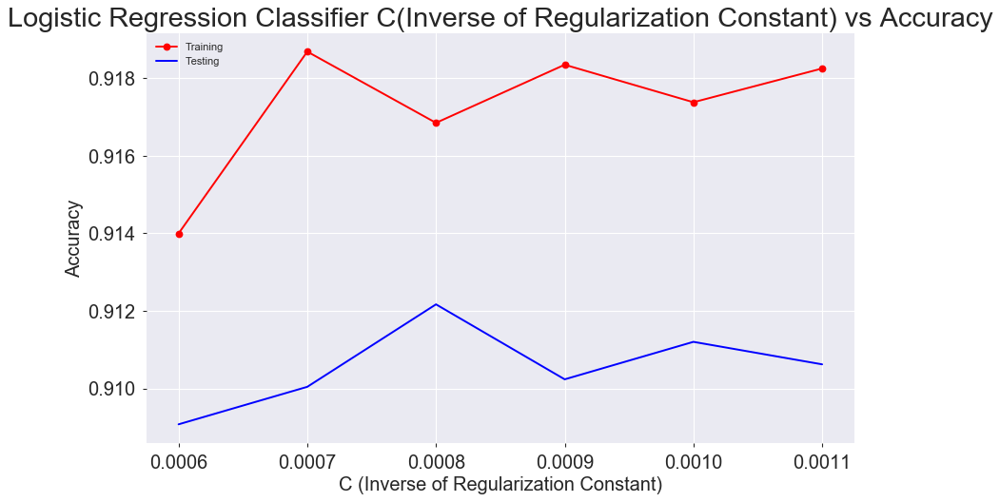

In [380]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(12,7), dpi=80, facecolor='w', edgecolor='k')
plt.xticks(C_param_range,fontsize=18)
plt.yticks(fontsize=18)
plt.title('Logistic Regression Classifier C(Inverse of Regularization Constant) vs Accuracy',size=26)
plt.xlabel("C (Inverse of Regularization Constant)",fontsize=18)
plt.ylabel("Accuracy",fontsize=18)
plt.plot(C_param_range,trainacclist,'ro-',label='Training')
plt.plot(C_param_range,testacclist,'b+-',label='Testing')
plt.legend()

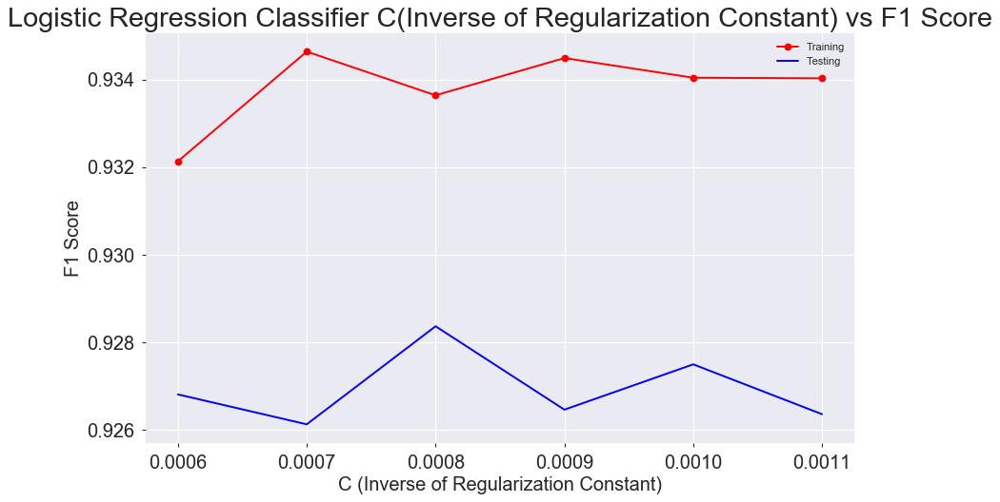

In [381]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(12,7), dpi=80, facecolor='w', edgecolor='k')
plt.xticks(C_param_range,fontsize=18)
plt.yticks(fontsize=18)
plt.title('Logistic Regression Classifier C(Inverse of Regularization Constant) vs F1 Score',size=26)
plt.xlabel("C (Inverse of Regularization Constant)",fontsize=18)
plt.ylabel("F1 Score",fontsize=18)
plt.plot(C_param_range,trainf1score,'ro-',label='Training')
plt.plot(C_param_range,testf1score,'b+-',label='Testing')
plt.legend()

# <font color='blue'>  K Neighbors Classifier KNN : F1 Score : 0.923 and Accuracy : 90.52%

In [264]:
knn = KNeighborsClassifier(n_neighbors=11)
#Fit the model
knn.fit(X_train_2, y_train_2)
#Compute accuracy on the training set
train_accuracy = knn.score(X_train_2, y_train_2)
#Compute accuracy on the test set
test_accuracy = knn.score(X_test_2, y_test_2)
y_pred_class=knn.predict(X_test_2)

In [265]:
print('Training Accuracy is : ',train_accuracy)
print('Testing Accuracy is : ',test_accuracy)
print('F1 Score is : ',f1_score(y_test_2, y_pred_class))

Training Accuracy is :  0.9156912063461352
Testing Accuracy is :  0.9052041013735732
F1 Score is :  0.9230043997485857


In [261]:
from sklearn.neighbors import KNeighborsClassifier

#Setup arrays to store training and test accuracies
neighbors = np.arange(3,15)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
trainf1=[]
testf1=[]
for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train_2, y_train_2)
    y_pred=knn.predict(X_train_2)
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train_2, y_train_2)
    trainf1.append(f1_score(y_train_2,y_pred))    
    y_pred=knn.predict(X_test_2)
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test_2, y_test_2) 
    testf1.append(f1_score(y_test_2,y_pred))    


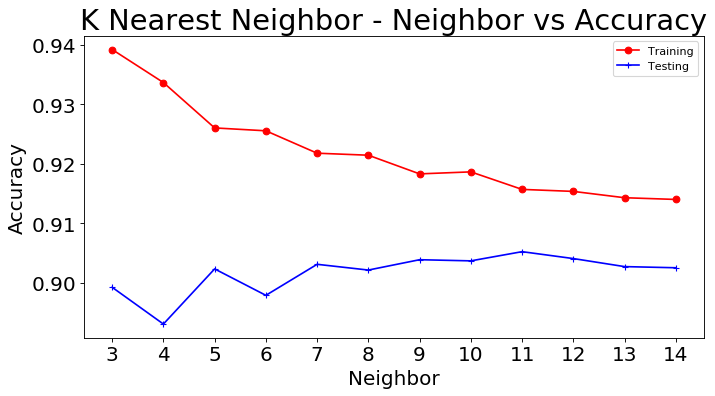

In [262]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')
plt.xticks(np.arange(3,15),fontsize=18)
plt.yticks(fontsize=18)
plt.plot(range(3,15),train_accuracy,'ro-',label='Training')
plt.plot(range(3,15),test_accuracy,'b+-',label='Testing')
plt.title('K Nearest Neighbor - Neighbor vs Accuracy',size=26)
plt.xlabel("Neighbor",fontsize=18)
plt.ylabel("Accuracy",fontsize=18)
plt.legend()

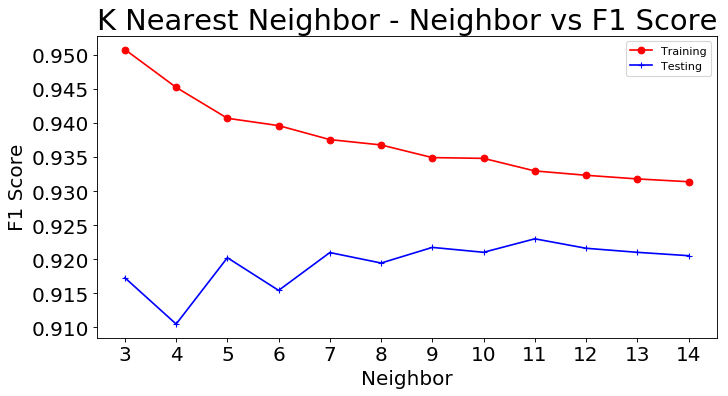

In [263]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')
plt.xticks(np.arange(3,15),fontsize=18)
plt.yticks(fontsize=18)
plt.plot(range(3,15),trainf1,'ro-',label='Training')
plt.plot(range(3,15),testf1,'b+-',label='Testing')
plt.title('K Nearest Neighbor - Neighbor vs F1 Score',size=26)
plt.xlabel("Neighbor",fontsize=18)
plt.ylabel("F1 Score",fontsize=18)
plt.legend()

# <font color='blue'> Decision Tree Classifier : F1 Score is : 0.9375 Test Accuracy is : 92.45% at Depth =8

In [266]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')

from sklearn.tree import DecisionTreeClassifier
trainf1=[]
testf1=[]
train_accuracy=[]
test_accuracy=[]
for d in range(3,15):
    clf = DecisionTreeClassifier(criterion="gini", max_depth=d)

    # Train Decision Tree Classifer
    clf = clf.fit(X_train_2,y_train_2)
    y_pred=clf.predict(X_train_2)
    trainf1.append(f1_score(y_train_2,y_pred))    
    y_pred = clf.predict(X_test_2)
    testf1.append(f1_score(y_test_2,y_pred))
    train_accuracy.append(clf.score(X_train_2, y_train_2))
    
    #Compute accuracy on the test set
    test_accuracy.append(clf.score(X_test_2, y_test_2) )


<Figure size 800x400 with 0 Axes>

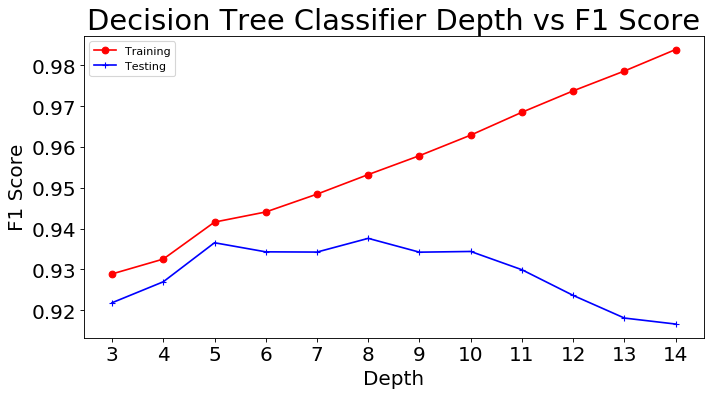

In [269]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')

plt.plot(range(3,15),trainf1,'ro-',label='Training')
plt.xticks(np.arange(3,15),fontsize=18)
plt.yticks(fontsize=18)
plt.title('Decision Tree Classifier Depth vs F1 Score',size=26)
plt.plot(range(3,15),testf1,'b+-',label='Testing')
plt.xlabel("Depth",fontsize=18)
plt.ylabel("F1 Score",fontsize=18)
plt.legend()

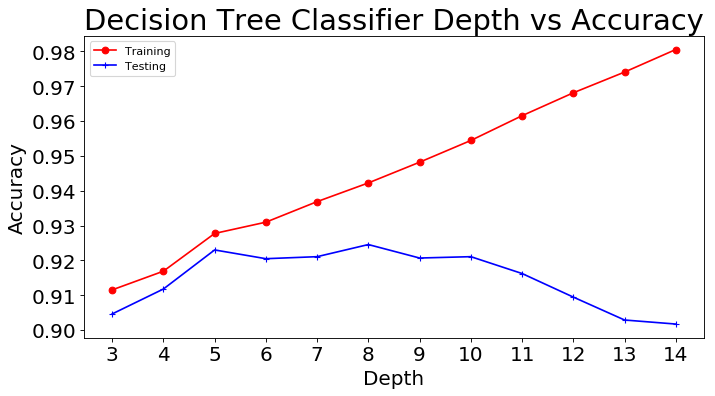

In [273]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')

plt.plot(range(3,15),train_accuracy,'ro-',label='Training')
plt.xticks(np.arange(3,15),fontsize=18)
plt.yticks(fontsize=18)
plt.title('Decision Tree Classifier Depth vs Accuracy',size=26)
plt.plot(range(3,15),test_accuracy,'b+-',label='Testing')
plt.xlabel("Depth",fontsize=18)
plt.ylabel("Accuracy",fontsize=18)
plt.legend()

In [276]:
print("At Depth = 8 ")
print("Test Accuracy is :",test_accuracy[5])
print("F1 Score is :",testf1[5])

At Depth = 8 
Test Accuracy is : 0.9245502031340684
F1 Score is : 0.9375999999999999


# <font color='blue'> Random Forest Classifier: At Depth = 16, f1 score of  0.9436 and Testing Accuracy of  93.13 

In [281]:
trainf1=[]
testf1=[]
train_accuracy=[]
test_accuracy=[]
i=0
for d in range(3,25):
    clf = RandomForestClassifier(n_estimators=200, random_state=42, max_depth=d) 
    # Train Decision Tree Classifer
    clf = clf.fit(X_train_2,y_train_2)
    y_pred=clf.predict(X_train_2)
    trainf1.append(f1_score(y_train_2,y_pred))    
    y_pred = clf.predict(X_test_2)
    testf1.append(f1_score(y_test_2,y_pred))
    train_accuracy.append(clf.score(X_train_2, y_train_2))
    
    #Compute accuracy on the test set
    test_accuracy.append(clf.score(X_test_2, y_test_2) )
    i+=1

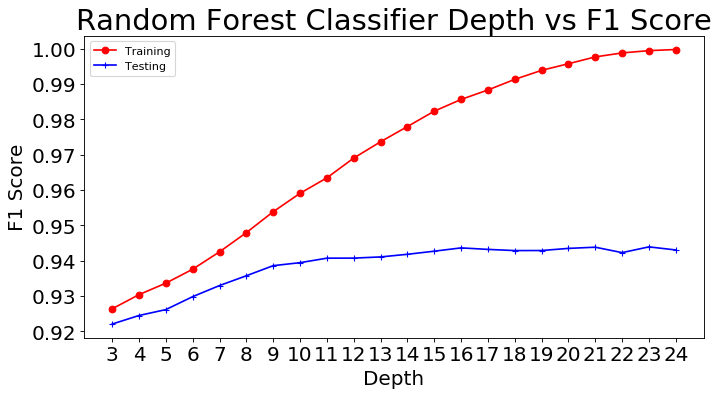

In [294]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')

plt.plot(range(3,25),trainf1,'ro-',label='Training')
plt.xticks(np.arange(3,25),fontsize=18)
plt.yticks(fontsize=18)
plt.title('Random Forest Classifier Depth vs F1 Score',size=26)
plt.xlabel("Depth",fontsize=18)
plt.ylabel("F1 Score",fontsize=18)
plt.plot(range(3,25),testf1,'b+-',label='Testing')
plt.legend()

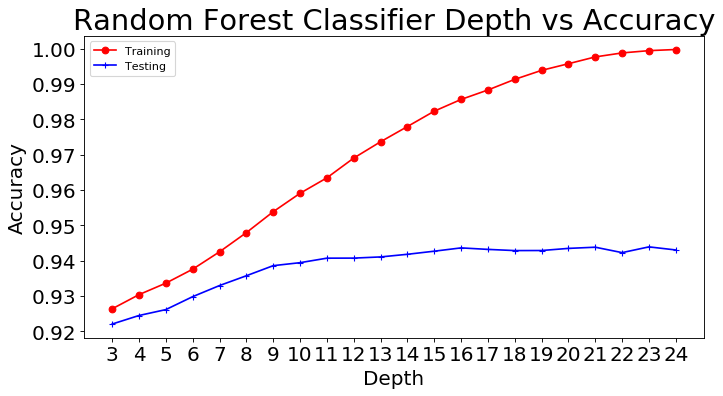

In [295]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(10,5), dpi=80, facecolor='w', edgecolor='k')

plt.plot(range(3,25),trainf1,'ro-',label='Training')
plt.xticks(np.arange(3,25),fontsize=18)
plt.yticks(fontsize=18)
plt.title('Random Forest Classifier Depth vs Accuracy',size=26)
plt.xlabel("Depth",fontsize=18)
plt.ylabel("Accuracy",fontsize=18)
plt.plot(range(3,25),testf1,'b+-',label='Testing')
plt.legend()

In [296]:
print(" At Depth = 16, Testing Accuracy of ",test_accuracy[13], "and f1 score of ",testf1[13])

 At Depth = 16, Testing Accuracy of  0.9313213387502418 and f1 score of  0.943623947911704


In [402]:
## Import the random forest model.
from sklearn.ensemble import RandomForestClassifier 
## This line instantiates the model. 
rf = RandomForestClassifier(n_estimators=200, random_state=42, max_depth=16) 
## Fit the model on your training data.
rf.fit(X_train_2, y_train_2) 
## And score it on your testing data.
rf.score(X_test_2, y_test_2)

0.9313213387502418

In [403]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
ypred=rf.predict(X_test_2)
print(classification_report(y_test_2, ypred))
print(confusion_matrix(y_test_2, ypred))

              precision    recall  f1-score   support

           0       0.98      0.85      0.91      2157
           1       0.90      0.99      0.94      3012

   micro avg       0.93      0.93      0.93      5169
   macro avg       0.94      0.92      0.93      5169
weighted avg       0.94      0.93      0.93      5169

[[1843  314]
 [  41 2971]]


# <font color='blue'> Relative Feature Importances of Features: Best 15 Features for Model

In [301]:
import pandas as pd
feature_importances = pd.DataFrame(rf.feature_importances_,index = opendf.drop(['final_result'],1).columns,columns=['importance']).sort_values('importance',ascending=False)
feature_importances[:15]

,importance
date_submitted_Mean,0.103519
Mean_date,0.093889
date_submitted_Sum,0.082346
date_Mean,0.067122
weight_Sum,0.065707
date_Max,0.059974
date_unregistration,0.034619
assessment_type_TMA_Sum,0.033904
id_assessment_Sum,0.032058
score_Mean,0.031788


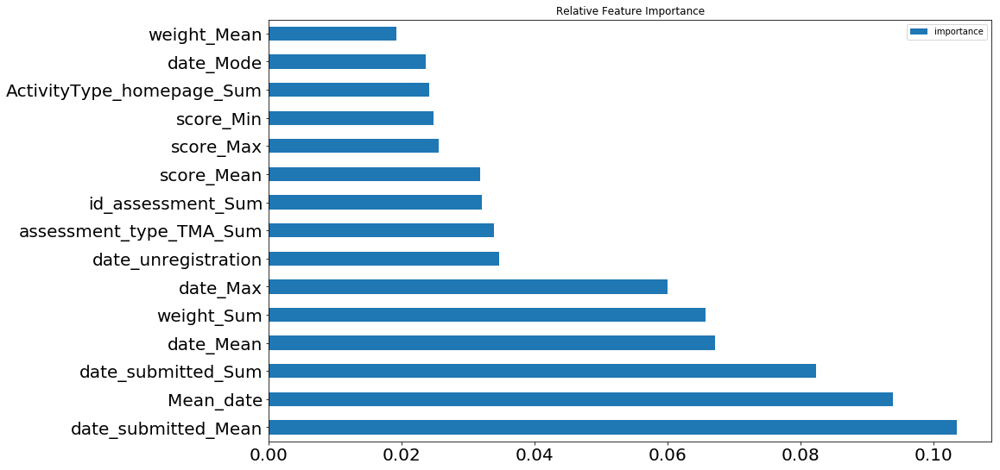

In [329]:
feature_importances[:15].plot(kind='barh', stacked=True,figsize=(15,9),title="Relative Feature Importance",fontsize=20,sort_columns=True)

# <font color='blue'> XGBOOST MODEL: 

In [353]:
#Creating Train Test split from here. X_test and y_test is TEST SET and they will not be touched upon from now until testing phase.
X_train, X_test, y_train, y_test = train_test_split(np.array(opendf.drop('final_result',axis=1)),np.array(opendf['final_result']), test_size=0.10, random_state=42)

# X_train and y_train will be further splitted into X_train_new and X_valid and same for y variable.
X_train_new, X_validation, y_train_new, y_validation = train_test_split(X_train,y_train, test_size=0.20, random_state=42)

# Creating Evaluation Set using X_validation and y_validation which we created in above step.
validation_set = [ ( X_validation, y_validation ) ]
print('Training Features Shape:', X_train.shape)
print('Training Label Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Label Shape:', y_test.shape)
f1=[]
acc=[]
for l in [0.075,0.076,0.077,0.078,0.079,0.08,0.081,0.082,0.083,0.084]:
    for d in [10,11,12,13,14,15,16,17,18,19,20,21,22]:
        xgbmodel = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bytree=0.5, gamma=0, learning_rate=l, max_delta_step=0,
               max_depth=d, min_child_weight=3, missing=None, n_estimators=100,
               n_jobs=1, nthread=4, objective='binary:logistic', random_state=0,
               reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=1337, silent=1,
               subsample=0.9)

        xgbmodel.fit( X_train_new, y_train_new, eval_metric="auc",early_stopping_rounds=300, eval_set=validation_set, verbose=True )
        ypred=xgbmodel.predict(X_test)
        score = accuracy_score(y_test,ypred)
        f1score=f1_score(y_test,ypred)
        f1.append(f1score)
        acc.append(score)
        print("For learning rate :  = ",l)
        print("Accuracy is : ",score)
        print("F1 Score is : ",f1score,"\n\n\n")

Training Features Shape: (23258, 127)
Training Label Shape: (23258,)
Testing Features Shape: (2585, 127)
Testing Label Shape: (2585,)
[0]	validation_0-auc:0.964664
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.969166
[2]	validation_0-auc:0.969594
[3]	validation_0-auc:0.972338
[4]	validation_0-auc:0.973996
[5]	validation_0-auc:0.973787
[6]	validation_0-auc:0.974144
[7]	validation_0-auc:0.975646
[8]	validation_0-auc:0.976154
[9]	validation_0-auc:0.976267
[10]	validation_0-auc:0.976545
[11]	validation_0-auc:0.976841
[12]	validation_0-auc:0.977019
[13]	validation_0-auc:0.977362
[14]	validation_0-auc:0.977279
[15]	validation_0-auc:0.977129
[16]	validation_0-auc:0.977228
[17]	validation_0-auc:0.97715
[18]	validation_0-auc:0.977211
[19]	validation_0-auc:0.977211
[20]	validation_0-auc:0.977237
[21]	validation_0-auc:0.977565
[22]	validation_0-auc:0.978032
[23]	validation_0-auc:0.978055
[24]	validation_0-auc:0.978234
[25]	validation_0-auc:0.978272
[26]	v

[49]	validation_0-auc:0.978794
[50]	validation_0-auc:0.978872
[51]	validation_0-auc:0.978938
[52]	validation_0-auc:0.979004
[53]	validation_0-auc:0.97895
[54]	validation_0-auc:0.978963
[55]	validation_0-auc:0.978904
[56]	validation_0-auc:0.978941
[57]	validation_0-auc:0.978905
[58]	validation_0-auc:0.979092
[59]	validation_0-auc:0.979181
[60]	validation_0-auc:0.979095
[61]	validation_0-auc:0.979124
[62]	validation_0-auc:0.979209
[63]	validation_0-auc:0.979223
[64]	validation_0-auc:0.979327
[65]	validation_0-auc:0.979374
[66]	validation_0-auc:0.979358
[67]	validation_0-auc:0.979405
[68]	validation_0-auc:0.979381
[69]	validation_0-auc:0.979348
[70]	validation_0-auc:0.979297
[71]	validation_0-auc:0.979369
[72]	validation_0-auc:0.97935
[73]	validation_0-auc:0.979446
[74]	validation_0-auc:0.979482
[75]	validation_0-auc:0.979463
[76]	validation_0-auc:0.979496
[77]	validation_0-auc:0.979478
[78]	validation_0-auc:0.979454
[79]	validation_0-auc:0.979425
[80]	validation_0-auc:0.979461
[81]	valid

Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966976
[2]	validation_0-auc:0.967281
[3]	validation_0-auc:0.97102
[4]	validation_0-auc:0.972454
[5]	validation_0-auc:0.971715
[6]	validation_0-auc:0.972817
[7]	validation_0-auc:0.974235
[8]	validation_0-auc:0.974556
[9]	validation_0-auc:0.97512
[10]	validation_0-auc:0.97552
[11]	validation_0-auc:0.976082
[12]	validation_0-auc:0.976341
[13]	validation_0-auc:0.976284
[14]	validation_0-auc:0.976312
[15]	validation_0-auc:0.976047
[16]	validation_0-auc:0.976256
[17]	validation_0-auc:0.976512
[18]	validation_0-auc:0.976574
[19]	validation_0-auc:0.976533
[20]	validation_0-auc:0.976468
[21]	validation_0-auc:0.976482
[22]	validation_0-auc:0.976896
[23]	validation_0-auc:0.977174
[24]	validation_0-auc:0.97751
[25]	validation_0-auc:0.977577
[26]	validation_0-auc:0.97763
[27]	validation_0-auc:0.977654
[28]	validation_0-auc:0.977542
[29]	validation_0-auc:0.977432
[30]	validation_0-auc:0.97746
[31]	validation_0-au

[55]	validation_0-auc:0.978791
[56]	validation_0-auc:0.978846
[57]	validation_0-auc:0.978831
[58]	validation_0-auc:0.978899
[59]	validation_0-auc:0.978953
[60]	validation_0-auc:0.978982
[61]	validation_0-auc:0.978934
[62]	validation_0-auc:0.978965
[63]	validation_0-auc:0.979018
[64]	validation_0-auc:0.979139
[65]	validation_0-auc:0.979207
[66]	validation_0-auc:0.979183
[67]	validation_0-auc:0.97925
[68]	validation_0-auc:0.979218
[69]	validation_0-auc:0.979216
[70]	validation_0-auc:0.979172
[71]	validation_0-auc:0.979183
[72]	validation_0-auc:0.979111
[73]	validation_0-auc:0.979121
[74]	validation_0-auc:0.979241
[75]	validation_0-auc:0.979271
[76]	validation_0-auc:0.979313
[77]	validation_0-auc:0.979235
[78]	validation_0-auc:0.979256
[79]	validation_0-auc:0.979217
[80]	validation_0-auc:0.979255
[81]	validation_0-auc:0.979293
[82]	validation_0-auc:0.979397
[83]	validation_0-auc:0.979432
[84]	validation_0-auc:0.979403
[85]	validation_0-auc:0.97941
[86]	validation_0-auc:0.979356
[87]	valid

[5]	validation_0-auc:0.972605
[6]	validation_0-auc:0.974004
[7]	validation_0-auc:0.975012
[8]	validation_0-auc:0.975302
[9]	validation_0-auc:0.97569
[10]	validation_0-auc:0.976133
[11]	validation_0-auc:0.976541
[12]	validation_0-auc:0.97672
[13]	validation_0-auc:0.976982
[14]	validation_0-auc:0.976935
[15]	validation_0-auc:0.976641
[16]	validation_0-auc:0.976912
[17]	validation_0-auc:0.977007
[18]	validation_0-auc:0.977012
[19]	validation_0-auc:0.976745
[20]	validation_0-auc:0.976758
[21]	validation_0-auc:0.976911
[22]	validation_0-auc:0.977322
[23]	validation_0-auc:0.977491
[24]	validation_0-auc:0.977761
[25]	validation_0-auc:0.977916
[26]	validation_0-auc:0.977735
[27]	validation_0-auc:0.977826
[28]	validation_0-auc:0.977912
[29]	validation_0-auc:0.977905
[30]	validation_0-auc:0.978057
[31]	validation_0-auc:0.978229
[32]	validation_0-auc:0.978317
[33]	validation_0-auc:0.978244
[34]	validation_0-auc:0.978079
[35]	validation_0-auc:0.978272
[36]	validation_0-auc:0.978393
[37]	validation

[61]	validation_0-auc:0.978795
[62]	validation_0-auc:0.978723
[63]	validation_0-auc:0.978668
[64]	validation_0-auc:0.97869
[65]	validation_0-auc:0.978716
[66]	validation_0-auc:0.978669
[67]	validation_0-auc:0.97877
[68]	validation_0-auc:0.978805
[69]	validation_0-auc:0.978818
[70]	validation_0-auc:0.978755
[71]	validation_0-auc:0.978753
[72]	validation_0-auc:0.978701
[73]	validation_0-auc:0.978789
[74]	validation_0-auc:0.978808
[75]	validation_0-auc:0.978761
[76]	validation_0-auc:0.97879
[77]	validation_0-auc:0.978843
[78]	validation_0-auc:0.978876
[79]	validation_0-auc:0.978802
[80]	validation_0-auc:0.978802
[81]	validation_0-auc:0.97882
[82]	validation_0-auc:0.978921
[83]	validation_0-auc:0.979
[84]	validation_0-auc:0.978979
[85]	validation_0-auc:0.979034
[86]	validation_0-auc:0.979017
[87]	validation_0-auc:0.979045
[88]	validation_0-auc:0.979035
[89]	validation_0-auc:0.978973
[90]	validation_0-auc:0.978926
[91]	validation_0-auc:0.978948
[92]	validation_0-auc:0.978904
[93]	validation

[12]	validation_0-auc:0.976595
[13]	validation_0-auc:0.977066
[14]	validation_0-auc:0.977245
[15]	validation_0-auc:0.977095
[16]	validation_0-auc:0.977277
[17]	validation_0-auc:0.977314
[18]	validation_0-auc:0.977368
[19]	validation_0-auc:0.977291
[20]	validation_0-auc:0.97733
[21]	validation_0-auc:0.977635
[22]	validation_0-auc:0.977988
[23]	validation_0-auc:0.978143
[24]	validation_0-auc:0.978331
[25]	validation_0-auc:0.978419
[26]	validation_0-auc:0.978367
[27]	validation_0-auc:0.978436
[28]	validation_0-auc:0.978392
[29]	validation_0-auc:0.978233
[30]	validation_0-auc:0.978337
[31]	validation_0-auc:0.978422
[32]	validation_0-auc:0.978388
[33]	validation_0-auc:0.978325
[34]	validation_0-auc:0.978292
[35]	validation_0-auc:0.978375
[36]	validation_0-auc:0.978321
[37]	validation_0-auc:0.978547
[38]	validation_0-auc:0.978621
[39]	validation_0-auc:0.978853
[40]	validation_0-auc:0.978909
[41]	validation_0-auc:0.979043
[42]	validation_0-auc:0.979024
[43]	validation_0-auc:0.979002
[44]	vali

[67]	validation_0-auc:0.978791
[68]	validation_0-auc:0.97883
[69]	validation_0-auc:0.978875
[70]	validation_0-auc:0.97891
[71]	validation_0-auc:0.978931
[72]	validation_0-auc:0.978805
[73]	validation_0-auc:0.978874
[74]	validation_0-auc:0.978901
[75]	validation_0-auc:0.978855
[76]	validation_0-auc:0.978885
[77]	validation_0-auc:0.978893
[78]	validation_0-auc:0.978867
[79]	validation_0-auc:0.978814
[80]	validation_0-auc:0.978869
[81]	validation_0-auc:0.978843
[82]	validation_0-auc:0.978927
[83]	validation_0-auc:0.978949
[84]	validation_0-auc:0.978938
[85]	validation_0-auc:0.978898
[86]	validation_0-auc:0.978849
[87]	validation_0-auc:0.978832
[88]	validation_0-auc:0.978853
[89]	validation_0-auc:0.978855
[90]	validation_0-auc:0.978888
[91]	validation_0-auc:0.978962
[92]	validation_0-auc:0.978993
[93]	validation_0-auc:0.978979
[94]	validation_0-auc:0.979016
[95]	validation_0-auc:0.979045
[96]	validation_0-auc:0.979045
[97]	validation_0-auc:0.979087
[98]	validation_0-auc:0.979088
[99]	valid

[17]	validation_0-auc:0.976683
[18]	validation_0-auc:0.976723
[19]	validation_0-auc:0.976558
[20]	validation_0-auc:0.976528
[21]	validation_0-auc:0.976388
[22]	validation_0-auc:0.97685
[23]	validation_0-auc:0.977159
[24]	validation_0-auc:0.977407
[25]	validation_0-auc:0.977533
[26]	validation_0-auc:0.977478
[27]	validation_0-auc:0.977672
[28]	validation_0-auc:0.977599
[29]	validation_0-auc:0.977718
[30]	validation_0-auc:0.977913
[31]	validation_0-auc:0.978099
[32]	validation_0-auc:0.977976
[33]	validation_0-auc:0.977967
[34]	validation_0-auc:0.978041
[35]	validation_0-auc:0.978072
[36]	validation_0-auc:0.978179
[37]	validation_0-auc:0.978435
[38]	validation_0-auc:0.978512
[39]	validation_0-auc:0.978708
[40]	validation_0-auc:0.978758
[41]	validation_0-auc:0.978968
[42]	validation_0-auc:0.979123
[43]	validation_0-auc:0.979061
[44]	validation_0-auc:0.979112
[45]	validation_0-auc:0.979104
[46]	validation_0-auc:0.979016
[47]	validation_0-auc:0.979075
[48]	validation_0-auc:0.978988
[49]	vali

[73]	validation_0-auc:0.978836
[74]	validation_0-auc:0.978908
[75]	validation_0-auc:0.978841
[76]	validation_0-auc:0.978835
[77]	validation_0-auc:0.978807
[78]	validation_0-auc:0.978833
[79]	validation_0-auc:0.978804
[80]	validation_0-auc:0.978855
[81]	validation_0-auc:0.978822
[82]	validation_0-auc:0.978817
[83]	validation_0-auc:0.978843
[84]	validation_0-auc:0.97885
[85]	validation_0-auc:0.97884
[86]	validation_0-auc:0.978782
[87]	validation_0-auc:0.978747
[88]	validation_0-auc:0.978787
[89]	validation_0-auc:0.978782
[90]	validation_0-auc:0.978757
[91]	validation_0-auc:0.978813
[92]	validation_0-auc:0.978786
[93]	validation_0-auc:0.978809
[94]	validation_0-auc:0.978839
[95]	validation_0-auc:0.978875
[96]	validation_0-auc:0.978854
[97]	validation_0-auc:0.978897
[98]	validation_0-auc:0.978893
[99]	validation_0-auc:0.978889
For learning rate :  =  0.076
Accuracy is :  0.9234042553191489
F1 Score is :  0.9355048859934852 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc

[23]	validation_0-auc:0.977745
[24]	validation_0-auc:0.978013
[25]	validation_0-auc:0.978143
[26]	validation_0-auc:0.977992
[27]	validation_0-auc:0.977876
[28]	validation_0-auc:0.977761
[29]	validation_0-auc:0.977772
[30]	validation_0-auc:0.977813
[31]	validation_0-auc:0.977971
[32]	validation_0-auc:0.978019
[33]	validation_0-auc:0.977959
[34]	validation_0-auc:0.97783
[35]	validation_0-auc:0.977932
[36]	validation_0-auc:0.978018
[37]	validation_0-auc:0.978225
[38]	validation_0-auc:0.978339
[39]	validation_0-auc:0.978444
[40]	validation_0-auc:0.978458
[41]	validation_0-auc:0.978616
[42]	validation_0-auc:0.978598
[43]	validation_0-auc:0.978521
[44]	validation_0-auc:0.978531
[45]	validation_0-auc:0.978492
[46]	validation_0-auc:0.978383
[47]	validation_0-auc:0.97844
[48]	validation_0-auc:0.978376
[49]	validation_0-auc:0.978366
[50]	validation_0-auc:0.978439
[51]	validation_0-auc:0.978604
[52]	validation_0-auc:0.978639
[53]	validation_0-auc:0.978601
[54]	validation_0-auc:0.978596
[55]	valid

[78]	validation_0-auc:0.979295
[79]	validation_0-auc:0.979262
[80]	validation_0-auc:0.979267
[81]	validation_0-auc:0.979291
[82]	validation_0-auc:0.979276
[83]	validation_0-auc:0.979258
[84]	validation_0-auc:0.979312
[85]	validation_0-auc:0.979312
[86]	validation_0-auc:0.979294
[87]	validation_0-auc:0.979325
[88]	validation_0-auc:0.979289
[89]	validation_0-auc:0.979259
[90]	validation_0-auc:0.979355
[91]	validation_0-auc:0.979384
[92]	validation_0-auc:0.979396
[93]	validation_0-auc:0.979363
[94]	validation_0-auc:0.979351
[95]	validation_0-auc:0.97936
[96]	validation_0-auc:0.979351
[97]	validation_0-auc:0.979394
[98]	validation_0-auc:0.979401
[99]	validation_0-auc:0.979405
For learning rate :  =  0.077
Accuracy is :  0.9272727272727272
F1 Score is :  0.938562091503268 



[0]	validation_0-auc:0.963964
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.96754
[2]	validation_0-auc:0.968333
[3]	validation_0-auc:0.971608
[4]	validation_0-auc:0.97337
[5]	v

[29]	validation_0-auc:0.977526
[30]	validation_0-auc:0.97749
[31]	validation_0-auc:0.977746
[32]	validation_0-auc:0.977737
[33]	validation_0-auc:0.977645
[34]	validation_0-auc:0.977513
[35]	validation_0-auc:0.977623
[36]	validation_0-auc:0.977701
[37]	validation_0-auc:0.977893
[38]	validation_0-auc:0.977918
[39]	validation_0-auc:0.978031
[40]	validation_0-auc:0.978045
[41]	validation_0-auc:0.978221
[42]	validation_0-auc:0.978216
[43]	validation_0-auc:0.978089
[44]	validation_0-auc:0.978153
[45]	validation_0-auc:0.978051
[46]	validation_0-auc:0.977961
[47]	validation_0-auc:0.977995
[48]	validation_0-auc:0.977931
[49]	validation_0-auc:0.977874
[50]	validation_0-auc:0.978031
[51]	validation_0-auc:0.978176
[52]	validation_0-auc:0.978063
[53]	validation_0-auc:0.978033
[54]	validation_0-auc:0.978114
[55]	validation_0-auc:0.978102
[56]	validation_0-auc:0.978197
[57]	validation_0-auc:0.978308
[58]	validation_0-auc:0.97845
[59]	validation_0-auc:0.978546
[60]	validation_0-auc:0.978589
[61]	valid

[85]	validation_0-auc:0.979936
[86]	validation_0-auc:0.979922
[87]	validation_0-auc:0.979927
[88]	validation_0-auc:0.979931
[89]	validation_0-auc:0.97995
[90]	validation_0-auc:0.979933
[91]	validation_0-auc:0.97996
[92]	validation_0-auc:0.980016
[93]	validation_0-auc:0.980086
[94]	validation_0-auc:0.980073
[95]	validation_0-auc:0.980116
[96]	validation_0-auc:0.980143
[97]	validation_0-auc:0.980165
[98]	validation_0-auc:0.980142
[99]	validation_0-auc:0.980143
For learning rate :  =  0.077
Accuracy is :  0.9234042553191489
F1 Score is :  0.935546875 



[0]	validation_0-auc:0.963655
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966669
[2]	validation_0-auc:0.967783
[3]	validation_0-auc:0.971394
[4]	validation_0-auc:0.972759
[5]	validation_0-auc:0.971978
[6]	validation_0-auc:0.972745
[7]	validation_0-auc:0.974154
[8]	validation_0-auc:0.974519
[9]	validation_0-auc:0.975119
[10]	validation_0-auc:0.975521
[11]	validation_0-auc:0.975991
[12]	validation

[36]	validation_0-auc:0.978446
[37]	validation_0-auc:0.978651
[38]	validation_0-auc:0.978589
[39]	validation_0-auc:0.978823
[40]	validation_0-auc:0.978917
[41]	validation_0-auc:0.978988
[42]	validation_0-auc:0.978951
[43]	validation_0-auc:0.978798
[44]	validation_0-auc:0.978754
[45]	validation_0-auc:0.978709
[46]	validation_0-auc:0.97854
[47]	validation_0-auc:0.97862
[48]	validation_0-auc:0.978548
[49]	validation_0-auc:0.978589
[50]	validation_0-auc:0.978748
[51]	validation_0-auc:0.978838
[52]	validation_0-auc:0.97882
[53]	validation_0-auc:0.978758
[54]	validation_0-auc:0.978771
[55]	validation_0-auc:0.978681
[56]	validation_0-auc:0.978711
[57]	validation_0-auc:0.97882
[58]	validation_0-auc:0.978823
[59]	validation_0-auc:0.978859
[60]	validation_0-auc:0.978837
[61]	validation_0-auc:0.978794
[62]	validation_0-auc:0.978819
[63]	validation_0-auc:0.978809
[64]	validation_0-auc:0.978853
[65]	validation_0-auc:0.978895
[66]	validation_0-auc:0.978857
[67]	validation_0-auc:0.978882
[68]	validat

[92]	validation_0-auc:0.979313
[93]	validation_0-auc:0.979345
[94]	validation_0-auc:0.979315
[95]	validation_0-auc:0.979357
[96]	validation_0-auc:0.979363
[97]	validation_0-auc:0.979313
[98]	validation_0-auc:0.979312
[99]	validation_0-auc:0.979325
For learning rate :  =  0.077
Accuracy is :  0.9234042553191489
F1 Score is :  0.935378590078329 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966804
[2]	validation_0-auc:0.966961
[3]	validation_0-auc:0.970955
[4]	validation_0-auc:0.972496
[5]	validation_0-auc:0.971845
[6]	validation_0-auc:0.973247
[7]	validation_0-auc:0.974759
[8]	validation_0-auc:0.97512
[9]	validation_0-auc:0.975389
[10]	validation_0-auc:0.975875
[11]	validation_0-auc:0.976251
[12]	validation_0-auc:0.9766
[13]	validation_0-auc:0.97687
[14]	validation_0-auc:0.977039
[15]	validation_0-auc:0.976887
[16]	validation_0-auc:0.97696
[17]	validation_0-auc:0.977121
[18]	validation_0-auc:0.977049
[19]	validat

[42]	validation_0-auc:0.978769
[43]	validation_0-auc:0.978639
[44]	validation_0-auc:0.978688
[45]	validation_0-auc:0.978638
[46]	validation_0-auc:0.978619
[47]	validation_0-auc:0.978684
[48]	validation_0-auc:0.978736
[49]	validation_0-auc:0.97876
[50]	validation_0-auc:0.978779
[51]	validation_0-auc:0.978811
[52]	validation_0-auc:0.978866
[53]	validation_0-auc:0.978834
[54]	validation_0-auc:0.978845
[55]	validation_0-auc:0.978826
[56]	validation_0-auc:0.978823
[57]	validation_0-auc:0.97883
[58]	validation_0-auc:0.978864
[59]	validation_0-auc:0.97893
[60]	validation_0-auc:0.978939
[61]	validation_0-auc:0.978944
[62]	validation_0-auc:0.978989
[63]	validation_0-auc:0.978973
[64]	validation_0-auc:0.979061
[65]	validation_0-auc:0.979119
[66]	validation_0-auc:0.979179
[67]	validation_0-auc:0.979184
[68]	validation_0-auc:0.979199
[69]	validation_0-auc:0.979174
[70]	validation_0-auc:0.979178
[71]	validation_0-auc:0.979199
[72]	validation_0-auc:0.979142
[73]	validation_0-auc:0.979258
[74]	valida

[98]	validation_0-auc:0.979384
[99]	validation_0-auc:0.979395
For learning rate :  =  0.078
Accuracy is :  0.9268858800773694
F1 Score is :  0.9382957884427032 



[0]	validation_0-auc:0.963623
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.967261
[2]	validation_0-auc:0.967283
[3]	validation_0-auc:0.971099
[4]	validation_0-auc:0.972911
[5]	validation_0-auc:0.972329
[6]	validation_0-auc:0.972836
[7]	validation_0-auc:0.974365
[8]	validation_0-auc:0.974855
[9]	validation_0-auc:0.97528
[10]	validation_0-auc:0.97577
[11]	validation_0-auc:0.976344
[12]	validation_0-auc:0.976606
[13]	validation_0-auc:0.977252
[14]	validation_0-auc:0.977169
[15]	validation_0-auc:0.976891
[16]	validation_0-auc:0.97688
[17]	validation_0-auc:0.976957
[18]	validation_0-auc:0.97704
[19]	validation_0-auc:0.976981
[20]	validation_0-auc:0.976863
[21]	validation_0-auc:0.977157
[22]	validation_0-auc:0.977484
[23]	validation_0-auc:0.977736
[24]	validation_0-auc:0.978099
[25]	valid

[49]	validation_0-auc:0.978712
[50]	validation_0-auc:0.978693
[51]	validation_0-auc:0.978841
[52]	validation_0-auc:0.978789
[53]	validation_0-auc:0.978821
[54]	validation_0-auc:0.978803
[55]	validation_0-auc:0.978754
[56]	validation_0-auc:0.978814
[57]	validation_0-auc:0.978835
[58]	validation_0-auc:0.97903
[59]	validation_0-auc:0.979044
[60]	validation_0-auc:0.979076
[61]	validation_0-auc:0.97903
[62]	validation_0-auc:0.979024
[63]	validation_0-auc:0.979034
[64]	validation_0-auc:0.979088
[65]	validation_0-auc:0.979151
[66]	validation_0-auc:0.979104
[67]	validation_0-auc:0.979121
[68]	validation_0-auc:0.979125
[69]	validation_0-auc:0.979121
[70]	validation_0-auc:0.979067
[71]	validation_0-auc:0.979096
[72]	validation_0-auc:0.979054
[73]	validation_0-auc:0.979118
[74]	validation_0-auc:0.979168
[75]	validation_0-auc:0.979145
[76]	validation_0-auc:0.979133
[77]	validation_0-auc:0.979139
[78]	validation_0-auc:0.979231
[79]	validation_0-auc:0.979115
[80]	validation_0-auc:0.979095
[81]	valid

Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966989
[2]	validation_0-auc:0.967002
[3]	validation_0-auc:0.970816
[4]	validation_0-auc:0.972392
[5]	validation_0-auc:0.971928
[6]	validation_0-auc:0.973255
[7]	validation_0-auc:0.974853
[8]	validation_0-auc:0.974946
[9]	validation_0-auc:0.975544
[10]	validation_0-auc:0.975998
[11]	validation_0-auc:0.976578
[12]	validation_0-auc:0.97688
[13]	validation_0-auc:0.976853
[14]	validation_0-auc:0.976992
[15]	validation_0-auc:0.976745
[16]	validation_0-auc:0.976671
[17]	validation_0-auc:0.976946
[18]	validation_0-auc:0.976849
[19]	validation_0-auc:0.976796
[20]	validation_0-auc:0.976908
[21]	validation_0-auc:0.977022
[22]	validation_0-auc:0.977379
[23]	validation_0-auc:0.977576
[24]	validation_0-auc:0.977707
[25]	validation_0-auc:0.977822
[26]	validation_0-auc:0.977881
[27]	validation_0-auc:0.977823
[28]	validation_0-auc:0.977666
[29]	validation_0-auc:0.977628
[30]	validation_0-auc:0.977671
[31]	validation

[54]	validation_0-auc:0.978548
[55]	validation_0-auc:0.978533
[56]	validation_0-auc:0.978559
[57]	validation_0-auc:0.978601
[58]	validation_0-auc:0.978649
[59]	validation_0-auc:0.978748
[60]	validation_0-auc:0.978731
[61]	validation_0-auc:0.978654
[62]	validation_0-auc:0.978758
[63]	validation_0-auc:0.978811
[64]	validation_0-auc:0.978871
[65]	validation_0-auc:0.978888
[66]	validation_0-auc:0.978835
[67]	validation_0-auc:0.978827
[68]	validation_0-auc:0.97879
[69]	validation_0-auc:0.978892
[70]	validation_0-auc:0.978919
[71]	validation_0-auc:0.978936
[72]	validation_0-auc:0.978918
[73]	validation_0-auc:0.978977
[74]	validation_0-auc:0.979003
[75]	validation_0-auc:0.978997
[76]	validation_0-auc:0.978975
[77]	validation_0-auc:0.978953
[78]	validation_0-auc:0.978982
[79]	validation_0-auc:0.978927
[80]	validation_0-auc:0.978857
[81]	validation_0-auc:0.978851
[82]	validation_0-auc:0.978918
[83]	validation_0-auc:0.979024
[84]	validation_0-auc:0.979056
[85]	validation_0-auc:0.979062
[86]	vali

[4]	validation_0-auc:0.973777
[5]	validation_0-auc:0.973086
[6]	validation_0-auc:0.974058
[7]	validation_0-auc:0.975342
[8]	validation_0-auc:0.975564
[9]	validation_0-auc:0.97583
[10]	validation_0-auc:0.97609
[11]	validation_0-auc:0.976483
[12]	validation_0-auc:0.976853
[13]	validation_0-auc:0.977395
[14]	validation_0-auc:0.977444
[15]	validation_0-auc:0.977259
[16]	validation_0-auc:0.97742
[17]	validation_0-auc:0.977274
[18]	validation_0-auc:0.977296
[19]	validation_0-auc:0.977304
[20]	validation_0-auc:0.977264
[21]	validation_0-auc:0.977483
[22]	validation_0-auc:0.977647
[23]	validation_0-auc:0.977774
[24]	validation_0-auc:0.977857
[25]	validation_0-auc:0.977846
[26]	validation_0-auc:0.977995
[27]	validation_0-auc:0.97812
[28]	validation_0-auc:0.978051
[29]	validation_0-auc:0.977932
[30]	validation_0-auc:0.977856
[31]	validation_0-auc:0.978093
[32]	validation_0-auc:0.978042
[33]	validation_0-auc:0.978007
[34]	validation_0-auc:0.978127
[35]	validation_0-auc:0.978203
[36]	validation_0-

[60]	validation_0-auc:0.978776
[61]	validation_0-auc:0.978773
[62]	validation_0-auc:0.978804
[63]	validation_0-auc:0.978799
[64]	validation_0-auc:0.978864
[65]	validation_0-auc:0.978923
[66]	validation_0-auc:0.97891
[67]	validation_0-auc:0.978902
[68]	validation_0-auc:0.978856
[69]	validation_0-auc:0.978819
[70]	validation_0-auc:0.97878
[71]	validation_0-auc:0.97881
[72]	validation_0-auc:0.978743
[73]	validation_0-auc:0.978854
[74]	validation_0-auc:0.978804
[75]	validation_0-auc:0.978786
[76]	validation_0-auc:0.978756
[77]	validation_0-auc:0.97872
[78]	validation_0-auc:0.978668
[79]	validation_0-auc:0.97867
[80]	validation_0-auc:0.978662
[81]	validation_0-auc:0.978592
[82]	validation_0-auc:0.978616
[83]	validation_0-auc:0.978622
[84]	validation_0-auc:0.978629
[85]	validation_0-auc:0.978656
[86]	validation_0-auc:0.978678
[87]	validation_0-auc:0.978852
[88]	validation_0-auc:0.978913
[89]	validation_0-auc:0.978863
[90]	validation_0-auc:0.978877
[91]	validation_0-auc:0.978897
[92]	validati

[11]	validation_0-auc:0.975941
[12]	validation_0-auc:0.976454
[13]	validation_0-auc:0.976852
[14]	validation_0-auc:0.976902
[15]	validation_0-auc:0.976656
[16]	validation_0-auc:0.976905
[17]	validation_0-auc:0.977138
[18]	validation_0-auc:0.977038
[19]	validation_0-auc:0.976824
[20]	validation_0-auc:0.97683
[21]	validation_0-auc:0.976966
[22]	validation_0-auc:0.977217
[23]	validation_0-auc:0.977404
[24]	validation_0-auc:0.977728
[25]	validation_0-auc:0.978
[26]	validation_0-auc:0.977942
[27]	validation_0-auc:0.977947
[28]	validation_0-auc:0.977809
[29]	validation_0-auc:0.977894
[30]	validation_0-auc:0.978025
[31]	validation_0-auc:0.978217
[32]	validation_0-auc:0.978217
[33]	validation_0-auc:0.978174
[34]	validation_0-auc:0.978169
[35]	validation_0-auc:0.978206
[36]	validation_0-auc:0.978339
[37]	validation_0-auc:0.978509
[38]	validation_0-auc:0.978454
[39]	validation_0-auc:0.978689
[40]	validation_0-auc:0.978744
[41]	validation_0-auc:0.978958
[42]	validation_0-auc:0.978976
[43]	validat

[66]	validation_0-auc:0.979347
[67]	validation_0-auc:0.979348
[68]	validation_0-auc:0.979368
[69]	validation_0-auc:0.979351
[70]	validation_0-auc:0.979327
[71]	validation_0-auc:0.979311
[72]	validation_0-auc:0.979299
[73]	validation_0-auc:0.979219
[74]	validation_0-auc:0.979293
[75]	validation_0-auc:0.979311
[76]	validation_0-auc:0.979333
[77]	validation_0-auc:0.979333
[78]	validation_0-auc:0.979361
[79]	validation_0-auc:0.979308
[80]	validation_0-auc:0.979294
[81]	validation_0-auc:0.979282
[82]	validation_0-auc:0.979317
[83]	validation_0-auc:0.979343
[84]	validation_0-auc:0.979288
[85]	validation_0-auc:0.979319
[86]	validation_0-auc:0.979355
[87]	validation_0-auc:0.979462
[88]	validation_0-auc:0.979536
[89]	validation_0-auc:0.979574
[90]	validation_0-auc:0.979531
[91]	validation_0-auc:0.97957
[92]	validation_0-auc:0.979571
[93]	validation_0-auc:0.979537
[94]	validation_0-auc:0.979528
[95]	validation_0-auc:0.979558
[96]	validation_0-auc:0.979534
[97]	validation_0-auc:0.9795
[98]	valida

[16]	validation_0-auc:0.977232
[17]	validation_0-auc:0.977294
[18]	validation_0-auc:0.977306
[19]	validation_0-auc:0.9772
[20]	validation_0-auc:0.977092
[21]	validation_0-auc:0.977399
[22]	validation_0-auc:0.977705
[23]	validation_0-auc:0.977894
[24]	validation_0-auc:0.978272
[25]	validation_0-auc:0.978356
[26]	validation_0-auc:0.978369
[27]	validation_0-auc:0.978254
[28]	validation_0-auc:0.978264
[29]	validation_0-auc:0.978299
[30]	validation_0-auc:0.97816
[31]	validation_0-auc:0.978351
[32]	validation_0-auc:0.978421
[33]	validation_0-auc:0.978349
[34]	validation_0-auc:0.978278
[35]	validation_0-auc:0.978175
[36]	validation_0-auc:0.978262
[37]	validation_0-auc:0.97844
[38]	validation_0-auc:0.978533
[39]	validation_0-auc:0.978724
[40]	validation_0-auc:0.978716
[41]	validation_0-auc:0.978965
[42]	validation_0-auc:0.978943
[43]	validation_0-auc:0.978796
[44]	validation_0-auc:0.978839
[45]	validation_0-auc:0.978781
[46]	validation_0-auc:0.978697
[47]	validation_0-auc:0.97876
[48]	validati

[72]	validation_0-auc:0.979105
[73]	validation_0-auc:0.979155
[74]	validation_0-auc:0.979207
[75]	validation_0-auc:0.979277
[76]	validation_0-auc:0.979266
[77]	validation_0-auc:0.979276
[78]	validation_0-auc:0.979234
[79]	validation_0-auc:0.979255
[80]	validation_0-auc:0.979205
[81]	validation_0-auc:0.979165
[82]	validation_0-auc:0.979243
[83]	validation_0-auc:0.979244
[84]	validation_0-auc:0.979316
[85]	validation_0-auc:0.979333
[86]	validation_0-auc:0.97933
[87]	validation_0-auc:0.979379
[88]	validation_0-auc:0.979368
[89]	validation_0-auc:0.979362
[90]	validation_0-auc:0.979351
[91]	validation_0-auc:0.979358
[92]	validation_0-auc:0.979429
[93]	validation_0-auc:0.979486
[94]	validation_0-auc:0.97951
[95]	validation_0-auc:0.979506
[96]	validation_0-auc:0.979542
[97]	validation_0-auc:0.979579
[98]	validation_0-auc:0.979571
[99]	validation_0-auc:0.979618
For learning rate :  =  0.08
Accuracy is :  0.9276595744680851
F1 Score is :  0.9388289172391233 



[0]	validation_0-auc:0.964168
Wil

[22]	validation_0-auc:0.977431
[23]	validation_0-auc:0.977713
[24]	validation_0-auc:0.977858
[25]	validation_0-auc:0.978118
[26]	validation_0-auc:0.97803
[27]	validation_0-auc:0.978192
[28]	validation_0-auc:0.978146
[29]	validation_0-auc:0.978182
[30]	validation_0-auc:0.978244
[31]	validation_0-auc:0.978323
[32]	validation_0-auc:0.978252
[33]	validation_0-auc:0.97815
[34]	validation_0-auc:0.978147
[35]	validation_0-auc:0.978133
[36]	validation_0-auc:0.978189
[37]	validation_0-auc:0.978585
[38]	validation_0-auc:0.978645
[39]	validation_0-auc:0.978789
[40]	validation_0-auc:0.978954
[41]	validation_0-auc:0.979145
[42]	validation_0-auc:0.979039
[43]	validation_0-auc:0.978904
[44]	validation_0-auc:0.978952
[45]	validation_0-auc:0.978914
[46]	validation_0-auc:0.978907
[47]	validation_0-auc:0.978949
[48]	validation_0-auc:0.978885
[49]	validation_0-auc:0.978899
[50]	validation_0-auc:0.978896
[51]	validation_0-auc:0.978972
[52]	validation_0-auc:0.978855
[53]	validation_0-auc:0.978814
[54]	valid

[78]	validation_0-auc:0.978899
[79]	validation_0-auc:0.978879
[80]	validation_0-auc:0.978901
[81]	validation_0-auc:0.978879
[82]	validation_0-auc:0.978833
[83]	validation_0-auc:0.97884
[84]	validation_0-auc:0.97881
[85]	validation_0-auc:0.978861
[86]	validation_0-auc:0.978807
[87]	validation_0-auc:0.97874
[88]	validation_0-auc:0.978747
[89]	validation_0-auc:0.978769
[90]	validation_0-auc:0.978768
[91]	validation_0-auc:0.978784
[92]	validation_0-auc:0.978762
[93]	validation_0-auc:0.978815
[94]	validation_0-auc:0.978814
[95]	validation_0-auc:0.978834
[96]	validation_0-auc:0.97885
[97]	validation_0-auc:0.978805
[98]	validation_0-auc:0.978724
[99]	validation_0-auc:0.978763
For learning rate :  =  0.08
Accuracy is :  0.9276595744680851
F1 Score is :  0.9389885807504079 



[0]	validation_0-auc:0.963548
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966861
[2]	validation_0-auc:0.967033
[3]	validation_0-auc:0.970938
[4]	validation_0-auc:0.972433
[5]	va

[28]	validation_0-auc:0.977963
[29]	validation_0-auc:0.978094
[30]	validation_0-auc:0.978161
[31]	validation_0-auc:0.978328
[32]	validation_0-auc:0.978222
[33]	validation_0-auc:0.978223
[34]	validation_0-auc:0.978075
[35]	validation_0-auc:0.978195
[36]	validation_0-auc:0.97839
[37]	validation_0-auc:0.97862
[38]	validation_0-auc:0.978628
[39]	validation_0-auc:0.978829
[40]	validation_0-auc:0.97898
[41]	validation_0-auc:0.979174
[42]	validation_0-auc:0.979264
[43]	validation_0-auc:0.979167
[44]	validation_0-auc:0.979176
[45]	validation_0-auc:0.979263
[46]	validation_0-auc:0.979238
[47]	validation_0-auc:0.979275
[48]	validation_0-auc:0.979275
[49]	validation_0-auc:0.979316
[50]	validation_0-auc:0.979291
[51]	validation_0-auc:0.979432
[52]	validation_0-auc:0.979435
[53]	validation_0-auc:0.97954
[54]	validation_0-auc:0.979526
[55]	validation_0-auc:0.9795
[56]	validation_0-auc:0.97949
[57]	validation_0-auc:0.979512
[58]	validation_0-auc:0.979625
[59]	validation_0-auc:0.979723
[60]	validation

[84]	validation_0-auc:0.979565
[85]	validation_0-auc:0.979595
[86]	validation_0-auc:0.979604
[87]	validation_0-auc:0.97957
[88]	validation_0-auc:0.979582
[89]	validation_0-auc:0.979628
[90]	validation_0-auc:0.979649
[91]	validation_0-auc:0.97974
[92]	validation_0-auc:0.979695
[93]	validation_0-auc:0.97968
[94]	validation_0-auc:0.979688
[95]	validation_0-auc:0.979665
[96]	validation_0-auc:0.979677
[97]	validation_0-auc:0.979675
[98]	validation_0-auc:0.979659
[99]	validation_0-auc:0.979678
For learning rate :  =  0.08
Accuracy is :  0.9264990328820116
F1 Score is :  0.9380300065231573 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966994
[2]	validation_0-auc:0.967015
[3]	validation_0-auc:0.970837
[4]	validation_0-auc:0.972477
[5]	validation_0-auc:0.971758
[6]	validation_0-auc:0.97285
[7]	validation_0-auc:0.974325
[8]	validation_0-auc:0.97467
[9]	validation_0-auc:0.975142
[10]	validation_0-auc:0.975528
[11]	validat

[35]	validation_0-auc:0.978816
[36]	validation_0-auc:0.978865
[37]	validation_0-auc:0.979067
[38]	validation_0-auc:0.979078
[39]	validation_0-auc:0.97926
[40]	validation_0-auc:0.979275
[41]	validation_0-auc:0.979412
[42]	validation_0-auc:0.97934
[43]	validation_0-auc:0.979245
[44]	validation_0-auc:0.979316
[45]	validation_0-auc:0.979321
[46]	validation_0-auc:0.979241
[47]	validation_0-auc:0.979274
[48]	validation_0-auc:0.979217
[49]	validation_0-auc:0.979316
[50]	validation_0-auc:0.97939
[51]	validation_0-auc:0.979399
[52]	validation_0-auc:0.979367
[53]	validation_0-auc:0.97925
[54]	validation_0-auc:0.979344
[55]	validation_0-auc:0.979324
[56]	validation_0-auc:0.979354
[57]	validation_0-auc:0.979374
[58]	validation_0-auc:0.979407
[59]	validation_0-auc:0.979465
[60]	validation_0-auc:0.979443
[61]	validation_0-auc:0.979419
[62]	validation_0-auc:0.979396
[63]	validation_0-auc:0.979356
[64]	validation_0-auc:0.97944
[65]	validation_0-auc:0.979419
[66]	validation_0-auc:0.97942
[67]	validatio

[91]	validation_0-auc:0.979552
[92]	validation_0-auc:0.979522
[93]	validation_0-auc:0.979536
[94]	validation_0-auc:0.979516
[95]	validation_0-auc:0.979587
[96]	validation_0-auc:0.979561
[97]	validation_0-auc:0.979601
[98]	validation_0-auc:0.979641
[99]	validation_0-auc:0.979648
For learning rate :  =  0.081
Accuracy is :  0.9253384912959381
F1 Score is :  0.9371130661453243 



[0]	validation_0-auc:0.963384
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.967613
[2]	validation_0-auc:0.967644
[3]	validation_0-auc:0.97129
[4]	validation_0-auc:0.973044
[5]	validation_0-auc:0.972277
[6]	validation_0-auc:0.973064
[7]	validation_0-auc:0.974583
[8]	validation_0-auc:0.97467
[9]	validation_0-auc:0.974941
[10]	validation_0-auc:0.975026
[11]	validation_0-auc:0.975673
[12]	validation_0-auc:0.976116
[13]	validation_0-auc:0.97671
[14]	validation_0-auc:0.976913
[15]	validation_0-auc:0.976926
[16]	validation_0-auc:0.977086
[17]	validation_0-auc:0.977206
[18]	vali

[42]	validation_0-auc:0.97872
[43]	validation_0-auc:0.978672
[44]	validation_0-auc:0.978791
[45]	validation_0-auc:0.978775
[46]	validation_0-auc:0.978741
[47]	validation_0-auc:0.978838
[48]	validation_0-auc:0.978879
[49]	validation_0-auc:0.978929
[50]	validation_0-auc:0.978924
[51]	validation_0-auc:0.979015
[52]	validation_0-auc:0.979006
[53]	validation_0-auc:0.978982
[54]	validation_0-auc:0.978986
[55]	validation_0-auc:0.978928
[56]	validation_0-auc:0.978947
[57]	validation_0-auc:0.979012
[58]	validation_0-auc:0.979045
[59]	validation_0-auc:0.979132
[60]	validation_0-auc:0.979136
[61]	validation_0-auc:0.979167
[62]	validation_0-auc:0.979233
[63]	validation_0-auc:0.979269
[64]	validation_0-auc:0.979286
[65]	validation_0-auc:0.979359
[66]	validation_0-auc:0.97931
[67]	validation_0-auc:0.979418
[68]	validation_0-auc:0.97939
[69]	validation_0-auc:0.979403
[70]	validation_0-auc:0.979308
[71]	validation_0-auc:0.979265
[72]	validation_0-auc:0.979271
[73]	validation_0-auc:0.979347
[74]	valida

[98]	validation_0-auc:0.978711
[99]	validation_0-auc:0.978694
For learning rate :  =  0.081
Accuracy is :  0.9237911025145068
F1 Score is :  0.9358515141647672 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966995
[2]	validation_0-auc:0.967021
[3]	validation_0-auc:0.970839
[4]	validation_0-auc:0.972458
[5]	validation_0-auc:0.971798
[6]	validation_0-auc:0.972861
[7]	validation_0-auc:0.974297
[8]	validation_0-auc:0.974701
[9]	validation_0-auc:0.975163
[10]	validation_0-auc:0.975533
[11]	validation_0-auc:0.97598
[12]	validation_0-auc:0.976421
[13]	validation_0-auc:0.976927
[14]	validation_0-auc:0.976946
[15]	validation_0-auc:0.976634
[16]	validation_0-auc:0.976788
[17]	validation_0-auc:0.976703
[18]	validation_0-auc:0.976609
[19]	validation_0-auc:0.976625
[20]	validation_0-auc:0.976692
[21]	validation_0-auc:0.977037
[22]	validation_0-auc:0.977331
[23]	validation_0-auc:0.977602
[24]	validation_0-auc:0.977818
[25]	va

[49]	validation_0-auc:0.978513
[50]	validation_0-auc:0.978576
[51]	validation_0-auc:0.978682
[52]	validation_0-auc:0.978545
[53]	validation_0-auc:0.978512
[54]	validation_0-auc:0.978503
[55]	validation_0-auc:0.978506
[56]	validation_0-auc:0.978613
[57]	validation_0-auc:0.978566
[58]	validation_0-auc:0.978557
[59]	validation_0-auc:0.978652
[60]	validation_0-auc:0.978745
[61]	validation_0-auc:0.978607
[62]	validation_0-auc:0.978694
[63]	validation_0-auc:0.978706
[64]	validation_0-auc:0.978769
[65]	validation_0-auc:0.978836
[66]	validation_0-auc:0.978762
[67]	validation_0-auc:0.978819
[68]	validation_0-auc:0.978799
[69]	validation_0-auc:0.978853
[70]	validation_0-auc:0.978866
[71]	validation_0-auc:0.978909
[72]	validation_0-auc:0.978893
[73]	validation_0-auc:0.978996
[74]	validation_0-auc:0.979007
[75]	validation_0-auc:0.979012
[76]	validation_0-auc:0.97896
[77]	validation_0-auc:0.978887
[78]	validation_0-auc:0.978859
[79]	validation_0-auc:0.978812
[80]	validation_0-auc:0.978819
[81]	vali

Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.969182
[2]	validation_0-auc:0.969631
[3]	validation_0-auc:0.972369
[4]	validation_0-auc:0.973903
[5]	validation_0-auc:0.973712
[6]	validation_0-auc:0.974238
[7]	validation_0-auc:0.975519
[8]	validation_0-auc:0.975919
[9]	validation_0-auc:0.976063
[10]	validation_0-auc:0.976407
[11]	validation_0-auc:0.976769
[12]	validation_0-auc:0.977122
[13]	validation_0-auc:0.977474
[14]	validation_0-auc:0.977536
[15]	validation_0-auc:0.977386
[16]	validation_0-auc:0.977286
[17]	validation_0-auc:0.977315
[18]	validation_0-auc:0.977379
[19]	validation_0-auc:0.977397
[20]	validation_0-auc:0.977387
[21]	validation_0-auc:0.97776
[22]	validation_0-auc:0.978006
[23]	validation_0-auc:0.978212
[24]	validation_0-auc:0.978483
[25]	validation_0-auc:0.978564
[26]	validation_0-auc:0.978573
[27]	validation_0-auc:0.978643
[28]	validation_0-auc:0.978557
[29]	validation_0-auc:0.978465
[30]	validation_0-auc:0.978559
[31]	validation

[55]	validation_0-auc:0.979092
[56]	validation_0-auc:0.979208
[57]	validation_0-auc:0.979218
[58]	validation_0-auc:0.979276
[59]	validation_0-auc:0.979351
[60]	validation_0-auc:0.979316
[61]	validation_0-auc:0.9793
[62]	validation_0-auc:0.979393
[63]	validation_0-auc:0.979384
[64]	validation_0-auc:0.979476
[65]	validation_0-auc:0.979541
[66]	validation_0-auc:0.979533
[67]	validation_0-auc:0.979553
[68]	validation_0-auc:0.979493
[69]	validation_0-auc:0.979432
[70]	validation_0-auc:0.97947
[71]	validation_0-auc:0.979448
[72]	validation_0-auc:0.979485
[73]	validation_0-auc:0.97948
[74]	validation_0-auc:0.979501
[75]	validation_0-auc:0.979551
[76]	validation_0-auc:0.979566
[77]	validation_0-auc:0.979582
[78]	validation_0-auc:0.979649
[79]	validation_0-auc:0.979571
[80]	validation_0-auc:0.979599
[81]	validation_0-auc:0.979563
[82]	validation_0-auc:0.979587
[83]	validation_0-auc:0.979674
[84]	validation_0-auc:0.979648
[85]	validation_0-auc:0.979636
[86]	validation_0-auc:0.979647
[87]	validat

[5]	validation_0-auc:0.972019
[6]	validation_0-auc:0.973185
[7]	validation_0-auc:0.9745
[8]	validation_0-auc:0.974899
[9]	validation_0-auc:0.975229
[10]	validation_0-auc:0.97519
[11]	validation_0-auc:0.975562
[12]	validation_0-auc:0.975877
[13]	validation_0-auc:0.976484
[14]	validation_0-auc:0.976497
[15]	validation_0-auc:0.976451
[16]	validation_0-auc:0.97676
[17]	validation_0-auc:0.976813
[18]	validation_0-auc:0.976884
[19]	validation_0-auc:0.976838
[20]	validation_0-auc:0.977032
[21]	validation_0-auc:0.97713
[22]	validation_0-auc:0.977581
[23]	validation_0-auc:0.97784
[24]	validation_0-auc:0.978049
[25]	validation_0-auc:0.978145
[26]	validation_0-auc:0.978099
[27]	validation_0-auc:0.978124
[28]	validation_0-auc:0.978091
[29]	validation_0-auc:0.978068
[30]	validation_0-auc:0.978292
[31]	validation_0-auc:0.978376
[32]	validation_0-auc:0.978287
[33]	validation_0-auc:0.978269
[34]	validation_0-auc:0.978171
[35]	validation_0-auc:0.978238
[36]	validation_0-auc:0.97838
[37]	validation_0-au

[61]	validation_0-auc:0.978755
[62]	validation_0-auc:0.978821
[63]	validation_0-auc:0.978874
[64]	validation_0-auc:0.978907
[65]	validation_0-auc:0.978996
[66]	validation_0-auc:0.978957
[67]	validation_0-auc:0.979027
[68]	validation_0-auc:0.978998
[69]	validation_0-auc:0.979084
[70]	validation_0-auc:0.979001
[71]	validation_0-auc:0.979024
[72]	validation_0-auc:0.979012
[73]	validation_0-auc:0.979
[74]	validation_0-auc:0.979007
[75]	validation_0-auc:0.979012
[76]	validation_0-auc:0.979042
[77]	validation_0-auc:0.979022
[78]	validation_0-auc:0.978988
[79]	validation_0-auc:0.978936
[80]	validation_0-auc:0.978932
[81]	validation_0-auc:0.978933
[82]	validation_0-auc:0.978989
[83]	validation_0-auc:0.979025
[84]	validation_0-auc:0.978983
[85]	validation_0-auc:0.978997
[86]	validation_0-auc:0.978963
[87]	validation_0-auc:0.978993
[88]	validation_0-auc:0.978994
[89]	validation_0-auc:0.979037
[90]	validation_0-auc:0.978996
[91]	validation_0-auc:0.979022
[92]	validation_0-auc:0.979028
[93]	valida

[12]	validation_0-auc:0.975885
[13]	validation_0-auc:0.976023
[14]	validation_0-auc:0.976222
[15]	validation_0-auc:0.975982
[16]	validation_0-auc:0.976202
[17]	validation_0-auc:0.976142
[18]	validation_0-auc:0.975982
[19]	validation_0-auc:0.975955
[20]	validation_0-auc:0.97588
[21]	validation_0-auc:0.976081
[22]	validation_0-auc:0.976303
[23]	validation_0-auc:0.976559
[24]	validation_0-auc:0.976972
[25]	validation_0-auc:0.977101
[26]	validation_0-auc:0.977196
[27]	validation_0-auc:0.977114
[28]	validation_0-auc:0.977166
[29]	validation_0-auc:0.97726
[30]	validation_0-auc:0.977467
[31]	validation_0-auc:0.977613
[32]	validation_0-auc:0.977501
[33]	validation_0-auc:0.977434
[34]	validation_0-auc:0.977322
[35]	validation_0-auc:0.97733
[36]	validation_0-auc:0.97744
[37]	validation_0-auc:0.97761
[38]	validation_0-auc:0.977545
[39]	validation_0-auc:0.977818
[40]	validation_0-auc:0.9777
[41]	validation_0-auc:0.977846
[42]	validation_0-auc:0.977902
[43]	validation_0-auc:0.977865
[44]	validation

[68]	validation_0-auc:0.978611
[69]	validation_0-auc:0.978622
[70]	validation_0-auc:0.978481
[71]	validation_0-auc:0.978536
[72]	validation_0-auc:0.978562
[73]	validation_0-auc:0.978607
[74]	validation_0-auc:0.978637
[75]	validation_0-auc:0.978616
[76]	validation_0-auc:0.978593
[77]	validation_0-auc:0.978554
[78]	validation_0-auc:0.978567
[79]	validation_0-auc:0.978551
[80]	validation_0-auc:0.978497
[81]	validation_0-auc:0.978437
[82]	validation_0-auc:0.9784
[83]	validation_0-auc:0.978357
[84]	validation_0-auc:0.978355
[85]	validation_0-auc:0.978341
[86]	validation_0-auc:0.9783
[87]	validation_0-auc:0.9783
[88]	validation_0-auc:0.978414
[89]	validation_0-auc:0.978492
[90]	validation_0-auc:0.9785
[91]	validation_0-auc:0.978571
[92]	validation_0-auc:0.978605
[93]	validation_0-auc:0.978624
[94]	validation_0-auc:0.978573
[95]	validation_0-auc:0.978672
[96]	validation_0-auc:0.978645
[97]	validation_0-auc:0.978688
[98]	validation_0-auc:0.978742
[99]	validation_0-auc:0.978736
For learning rat

[18]	validation_0-auc:0.977184
[19]	validation_0-auc:0.977191
[20]	validation_0-auc:0.977147
[21]	validation_0-auc:0.977589
[22]	validation_0-auc:0.9778
[23]	validation_0-auc:0.978143
[24]	validation_0-auc:0.978342
[25]	validation_0-auc:0.978402
[26]	validation_0-auc:0.978392
[27]	validation_0-auc:0.978524
[28]	validation_0-auc:0.978468
[29]	validation_0-auc:0.978442
[30]	validation_0-auc:0.978501
[31]	validation_0-auc:0.97863
[32]	validation_0-auc:0.978664
[33]	validation_0-auc:0.978568
[34]	validation_0-auc:0.978659
[35]	validation_0-auc:0.978597
[36]	validation_0-auc:0.9788
[37]	validation_0-auc:0.979089
[38]	validation_0-auc:0.978967
[39]	validation_0-auc:0.979071
[40]	validation_0-auc:0.979162
[41]	validation_0-auc:0.979219
[42]	validation_0-auc:0.979201
[43]	validation_0-auc:0.979154
[44]	validation_0-auc:0.979198
[45]	validation_0-auc:0.979172
[46]	validation_0-auc:0.979132
[47]	validation_0-auc:0.979288
[48]	validation_0-auc:0.979235
[49]	validation_0-auc:0.979253
[50]	validati

[74]	validation_0-auc:0.978864
[75]	validation_0-auc:0.978889
[76]	validation_0-auc:0.9789
[77]	validation_0-auc:0.978949
[78]	validation_0-auc:0.97895
[79]	validation_0-auc:0.978913
[80]	validation_0-auc:0.978945
[81]	validation_0-auc:0.978861
[82]	validation_0-auc:0.978883
[83]	validation_0-auc:0.978879
[84]	validation_0-auc:0.978863
[85]	validation_0-auc:0.978916
[86]	validation_0-auc:0.978887
[87]	validation_0-auc:0.978842
[88]	validation_0-auc:0.978815
[89]	validation_0-auc:0.978855
[90]	validation_0-auc:0.978828
[91]	validation_0-auc:0.978843
[92]	validation_0-auc:0.978846
[93]	validation_0-auc:0.978886
[94]	validation_0-auc:0.978865
[95]	validation_0-auc:0.978852
[96]	validation_0-auc:0.978854
[97]	validation_0-auc:0.97885
[98]	validation_0-auc:0.978829
[99]	validation_0-auc:0.97884
For learning rate :  =  0.083
Accuracy is :  0.9288201160541586
F1 Score is :  0.9400651465798046 



[0]	validation_0-auc:0.963601
Will train until validation_0-auc hasn't improved in 300 rounds.
[1

[25]	validation_0-auc:0.97759
[26]	validation_0-auc:0.977532
[27]	validation_0-auc:0.977456
[28]	validation_0-auc:0.977425
[29]	validation_0-auc:0.977478
[30]	validation_0-auc:0.977498
[31]	validation_0-auc:0.977724
[32]	validation_0-auc:0.977776
[33]	validation_0-auc:0.97774
[34]	validation_0-auc:0.977652
[35]	validation_0-auc:0.977706
[36]	validation_0-auc:0.97786
[37]	validation_0-auc:0.978053
[38]	validation_0-auc:0.978035
[39]	validation_0-auc:0.978265
[40]	validation_0-auc:0.978222
[41]	validation_0-auc:0.97831
[42]	validation_0-auc:0.978351
[43]	validation_0-auc:0.978313
[44]	validation_0-auc:0.978442
[45]	validation_0-auc:0.978516
[46]	validation_0-auc:0.978512
[47]	validation_0-auc:0.978492
[48]	validation_0-auc:0.97849
[49]	validation_0-auc:0.978496
[50]	validation_0-auc:0.978668
[51]	validation_0-auc:0.978701
[52]	validation_0-auc:0.978638
[53]	validation_0-auc:0.978552
[54]	validation_0-auc:0.978592
[55]	validation_0-auc:0.97851
[56]	validation_0-auc:0.978512
[57]	validatio

[80]	validation_0-auc:0.978735
[81]	validation_0-auc:0.978716
[82]	validation_0-auc:0.97876
[83]	validation_0-auc:0.978855
[84]	validation_0-auc:0.978853
[85]	validation_0-auc:0.978807
[86]	validation_0-auc:0.978769
[87]	validation_0-auc:0.978749
[88]	validation_0-auc:0.978771
[89]	validation_0-auc:0.978789
[90]	validation_0-auc:0.978851
[91]	validation_0-auc:0.978833
[92]	validation_0-auc:0.978821
[93]	validation_0-auc:0.978787
[94]	validation_0-auc:0.978835
[95]	validation_0-auc:0.978831
[96]	validation_0-auc:0.978855
[97]	validation_0-auc:0.978887
[98]	validation_0-auc:0.978849
[99]	validation_0-auc:0.978879
For learning rate :  =  0.083
Accuracy is :  0.9264990328820116
F1 Score is :  0.9382716049382717 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966983
[2]	validation_0-auc:0.967021
[3]	validation_0-auc:0.970651
[4]	validation_0-auc:0.971833
[5]	validation_0-auc:0.971326
[6]	validation_0-auc:0.972567
[7]	

[30]	validation_0-auc:0.977826
[31]	validation_0-auc:0.977996
[32]	validation_0-auc:0.977981
[33]	validation_0-auc:0.977962
[34]	validation_0-auc:0.977863
[35]	validation_0-auc:0.977859
[36]	validation_0-auc:0.97801
[37]	validation_0-auc:0.978234
[38]	validation_0-auc:0.978212
[39]	validation_0-auc:0.978492
[40]	validation_0-auc:0.978473
[41]	validation_0-auc:0.978638
[42]	validation_0-auc:0.978545
[43]	validation_0-auc:0.978486
[44]	validation_0-auc:0.978716
[45]	validation_0-auc:0.97869
[46]	validation_0-auc:0.978594
[47]	validation_0-auc:0.978589
[48]	validation_0-auc:0.978561
[49]	validation_0-auc:0.978701
[50]	validation_0-auc:0.978752
[51]	validation_0-auc:0.978754
[52]	validation_0-auc:0.978681
[53]	validation_0-auc:0.978654
[54]	validation_0-auc:0.978694
[55]	validation_0-auc:0.978641
[56]	validation_0-auc:0.978655
[57]	validation_0-auc:0.97868
[58]	validation_0-auc:0.978692
[59]	validation_0-auc:0.978727
[60]	validation_0-auc:0.978816
[61]	validation_0-auc:0.978796
[62]	valida

[86]	validation_0-auc:0.979789
[87]	validation_0-auc:0.979758
[88]	validation_0-auc:0.979772
[89]	validation_0-auc:0.9798
[90]	validation_0-auc:0.979785
[91]	validation_0-auc:0.979775
[92]	validation_0-auc:0.97979
[93]	validation_0-auc:0.979839
[94]	validation_0-auc:0.979833
[95]	validation_0-auc:0.979897
[96]	validation_0-auc:0.979859
[97]	validation_0-auc:0.979874
[98]	validation_0-auc:0.979884
[99]	validation_0-auc:0.979924
For learning rate :  =  0.084
Accuracy is :  0.9241779497098646
F1 Score is :  0.936156351791531 



[0]	validation_0-auc:0.963964
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.967544
[2]	validation_0-auc:0.968359
[3]	validation_0-auc:0.971585
[4]	validation_0-auc:0.973281
[5]	validation_0-auc:0.972203
[6]	validation_0-auc:0.973284
[7]	validation_0-auc:0.97481
[8]	validation_0-auc:0.97522
[9]	validation_0-auc:0.975507
[10]	validation_0-auc:0.97597
[11]	validation_0-auc:0.976426
[12]	validation_0-auc:0.976714
[13]	validati

[37]	validation_0-auc:0.977878
[38]	validation_0-auc:0.97789
[39]	validation_0-auc:0.97816
[40]	validation_0-auc:0.978139
[41]	validation_0-auc:0.978358
[42]	validation_0-auc:0.978394
[43]	validation_0-auc:0.978238
[44]	validation_0-auc:0.978286
[45]	validation_0-auc:0.978321
[46]	validation_0-auc:0.978234
[47]	validation_0-auc:0.978334
[48]	validation_0-auc:0.978219
[49]	validation_0-auc:0.978227
[50]	validation_0-auc:0.978386
[51]	validation_0-auc:0.978471
[52]	validation_0-auc:0.978431
[53]	validation_0-auc:0.978476
[54]	validation_0-auc:0.978564
[55]	validation_0-auc:0.9786
[56]	validation_0-auc:0.97866
[57]	validation_0-auc:0.978715
[58]	validation_0-auc:0.978787
[59]	validation_0-auc:0.978825
[60]	validation_0-auc:0.978739
[61]	validation_0-auc:0.978727
[62]	validation_0-auc:0.978801
[63]	validation_0-auc:0.978838
[64]	validation_0-auc:0.978907
[65]	validation_0-auc:0.978984
[66]	validation_0-auc:0.979002
[67]	validation_0-auc:0.979038
[68]	validation_0-auc:0.979038
[69]	validati

[93]	validation_0-auc:0.979105
[94]	validation_0-auc:0.979199
[95]	validation_0-auc:0.979181
[96]	validation_0-auc:0.979285
[97]	validation_0-auc:0.979336
[98]	validation_0-auc:0.979402
[99]	validation_0-auc:0.97941
For learning rate :  =  0.084
Accuracy is :  0.9245647969052224
F1 Score is :  0.936378466557912 



[0]	validation_0-auc:0.963655
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.96699
[2]	validation_0-auc:0.967086
[3]	validation_0-auc:0.970683
[4]	validation_0-auc:0.97211
[5]	validation_0-auc:0.971539
[6]	validation_0-auc:0.972798
[7]	validation_0-auc:0.974195
[8]	validation_0-auc:0.974444
[9]	validation_0-auc:0.974765
[10]	validation_0-auc:0.975151
[11]	validation_0-auc:0.97546
[12]	validation_0-auc:0.97578
[13]	validation_0-auc:0.975842
[14]	validation_0-auc:0.976055
[15]	validation_0-auc:0.975911
[16]	validation_0-auc:0.976123
[17]	validation_0-auc:0.976353
[18]	validation_0-auc:0.976084
[19]	validation_0-auc:0.976105
[20]	validat

[43]	validation_0-auc:0.978821
[44]	validation_0-auc:0.978797
[45]	validation_0-auc:0.978765
[46]	validation_0-auc:0.978717
[47]	validation_0-auc:0.978844
[48]	validation_0-auc:0.978789
[49]	validation_0-auc:0.978819
[50]	validation_0-auc:0.978901
[51]	validation_0-auc:0.979016
[52]	validation_0-auc:0.979042
[53]	validation_0-auc:0.978989
[54]	validation_0-auc:0.979057
[55]	validation_0-auc:0.979021
[56]	validation_0-auc:0.978911
[57]	validation_0-auc:0.979028
[58]	validation_0-auc:0.978973
[59]	validation_0-auc:0.979062
[60]	validation_0-auc:0.97901
[61]	validation_0-auc:0.978932
[62]	validation_0-auc:0.978909
[63]	validation_0-auc:0.978963
[64]	validation_0-auc:0.978982
[65]	validation_0-auc:0.979105
[66]	validation_0-auc:0.979119
[67]	validation_0-auc:0.97921
[68]	validation_0-auc:0.979173
[69]	validation_0-auc:0.979152
[70]	validation_0-auc:0.97917
[71]	validation_0-auc:0.979129
[72]	validation_0-auc:0.979032
[73]	validation_0-auc:0.979109
[74]	validation_0-auc:0.979185
[75]	valida

[98]	validation_0-auc:0.979704
[99]	validation_0-auc:0.979699
For learning rate :  =  0.084
Accuracy is :  0.9272727272727272
F1 Score is :  0.9387222946544981 



[0]	validation_0-auc:0.963673
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.966986
[2]	validation_0-auc:0.967023
[3]	validation_0-auc:0.97065
[4]	validation_0-auc:0.972046
[5]	validation_0-auc:0.971587
[6]	validation_0-auc:0.97287
[7]	validation_0-auc:0.974491
[8]	validation_0-auc:0.974625
[9]	validation_0-auc:0.974988
[10]	validation_0-auc:0.975244
[11]	validation_0-auc:0.975681
[12]	validation_0-auc:0.976193
[13]	validation_0-auc:0.976559
[14]	validation_0-auc:0.976824
[15]	validation_0-auc:0.976589
[16]	validation_0-auc:0.976769
[17]	validation_0-auc:0.97682
[18]	validation_0-auc:0.976817
[19]	validation_0-auc:0.976691
[20]	validation_0-auc:0.976797
[21]	validation_0-auc:0.977116
[22]	validation_0-auc:0.977385
[23]	validation_0-auc:0.977663
[24]	validation_0-auc:0.97786
[25]	valid

In [354]:
max(acc)

0.9315280464216634

In [355]:
max(f1)

0.9421000981354268

# <font color='blue'>XGBOOST MODEL BEST :F1 Score = 0.9421 and Accuracy = 0.9315 
# <font color='blue'> Parameters:  Best Learning rate 0.081  , Depth = 10
    

In [372]:
#Creating Train Test split from here. X_test and y_test is TEST SET and they will not be touched upon from now until testing phase.
X_train, X_test, y_train, y_test = train_test_split(np.array(opendf.drop('final_result',axis=1)),np.array(opendf['final_result']), test_size=0.10, random_state=42)

# X_train and y_train will be further splitted into X_train_new and X_valid and same for y variable.
X_train_new, X_validation, y_train_new, y_validation = train_test_split(X_train,y_train, test_size=0.20, random_state=42)

# Creating Evaluation Set using X_validation and y_validation which we created in above step.
validation_set = [ ( X_validation, y_validation ) ]
print('Training Features Shape:', X_train.shape)
print('Training Label Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Label Shape:', y_test.shape)
xgbmodel = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
           colsample_bytree=0.5, gamma=0, learning_rate=0.081, max_delta_step=0,
           max_depth=10, min_child_weight=3, missing=None, n_estimators=100,
           n_jobs=1, nthread=4, objective='binary:logistic', random_state=0,
           reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=1337, silent=1,
           subsample=0.9)
xgbmodel.fit( X_train_new, y_train_new, eval_metric="auc",early_stopping_rounds=300, eval_set=validation_set, verbose=True )
ypred=xgbmodel.predict(X_test)
score = accuracy_score(y_test,ypred)
f1score=f1_score(y_test,ypred)
f1.append(f1score)
acc.append(score)
print("For learning rate :  = ",0.081)
print("Accuracy is : ",score)
print("F1 Score is : ",f1score,"\n\n\n")

Training Features Shape: (23258, 127)
Training Label Shape: (23258,)
Testing Features Shape: (2585, 127)
Testing Label Shape: (2585,)
[0]	validation_0-auc:0.964664
Will train until validation_0-auc hasn't improved in 300 rounds.
[1]	validation_0-auc:0.96917
[2]	validation_0-auc:0.969624
[3]	validation_0-auc:0.972346
[4]	validation_0-auc:0.973873
[5]	validation_0-auc:0.9737
[6]	validation_0-auc:0.974307
[7]	validation_0-auc:0.975551
[8]	validation_0-auc:0.975955
[9]	validation_0-auc:0.976147
[10]	validation_0-auc:0.976494
[11]	validation_0-auc:0.976684
[12]	validation_0-auc:0.977002
[13]	validation_0-auc:0.977433
[14]	validation_0-auc:0.977444
[15]	validation_0-auc:0.977422
[16]	validation_0-auc:0.977387
[17]	validation_0-auc:0.977483
[18]	validation_0-auc:0.977584
[19]	validation_0-auc:0.9776
[20]	validation_0-auc:0.977832
[21]	validation_0-auc:0.978149
[22]	validation_0-auc:0.978367
[23]	validation_0-auc:0.978566
[24]	validation_0-auc:0.978752
[25]	validation_0-auc:0.978791
[26]	valid

In [373]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
print(classification_report(y_test, ypred))
print(confusion_matrix(y_test, ypred))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92      1104
           1       0.91      0.97      0.94      1481

   micro avg       0.93      0.93      0.93      2585
   macro avg       0.94      0.92      0.93      2585
weighted avg       0.93      0.93      0.93      2585

[[ 968  136]
 [  41 1440]]


In [374]:
xgbmodel.feature_importances_
d={}
for i in range(0,opendf.drop('final_result',1).shape[1]-1):
    d[opendf.drop('final_result',1).columns[i]]=xgbmodel.feature_importances_[i]
d=sorted(d.items(),key= lambda value: value[1],reverse=True)
d

[('date_submitted_Mean', 0.18771051),
 ('date_unregistration', 0.11053139),
 ('date_Mean', 0.036873545),
 ('weight_Sum', 0.035936706),
 ('assessment_type_CMA_Sum', 0.033528946),
 ('Mean_date', 0.031892624),
 ('date_submitted_Sum', 0.024254277),
 ('assessment_type_Exam_Sum', 0.022789065),
 ('score_Mean', 0.020924052),
 ('date_Mode', 0.01903229),
 ('assessment_type_TMA_Sum', 0.018014407),
 ('weight_Min', 0.017776038),
 ('code_module_FFF', 0.016504662),
 ('score_Min', 0.01456422),
 ('code_module_CCC', 0.0141060725),
 ('weight_Mode', 0.0130035775),
 ('id_assessment_Sum', 0.012311276),
 ('code_module_DDD', 0.011018931),
 ('weight_Mean', 0.010848449),
 ('score_Max', 0.010519447),
 ('id_assessment_Mean', 0.009505561),
 ('assessment_type_CMA_Mean', 0.009312908),
 ('code_module_EEE', 0.0077167954),
 ('date_Min', 0.006862016),
 ('Mode_id_site', 0.0063158646),
 ('code_module_BBB', 0.0060503217),
 ('ActivityType_homepage_Sum', 0.006023251),
 ('assessment_type_TMA_Mean', 0.0058124545),
 ('date_Max'

In [400]:
p=pd.DataFrame(d)
p.index=pd.DataFrame(d)[0]
p.drop(0,1,inplace=True)
p.columns=['importances']
p[:15]


,importances
0,
date_submitted_Mean,0.187711
date_unregistration,0.110531
date_Mean,0.036874
weight_Sum,0.035937
assessment_type_CMA_Sum,0.033529
Mean_date,0.031893
date_submitted_Sum,0.024254
assessment_type_Exam_Sum,0.022789
score_Mean,0.020924


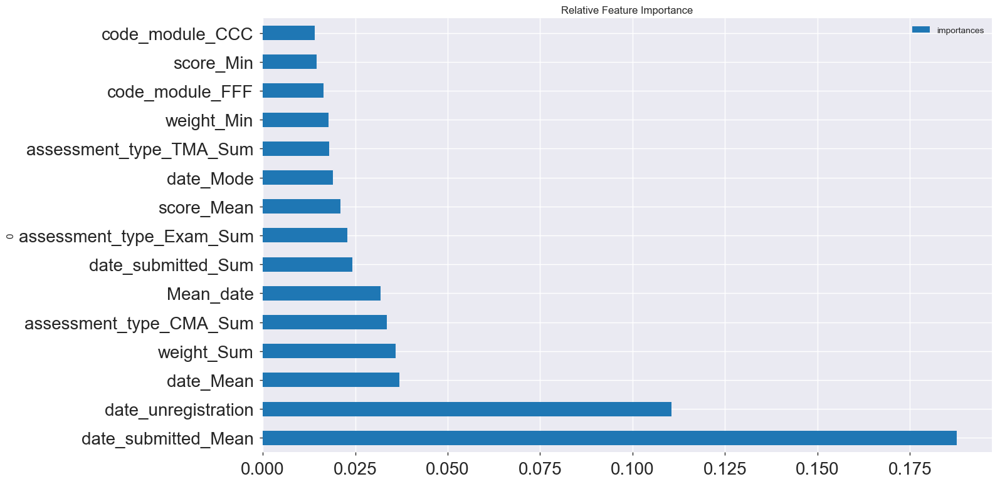

In [401]:
p[:15].plot(kind='barh', stacked=True,figsize=(15,9),title="Relative Feature Importance",fontsize=20,sort_columns=True)